### Making training dataset

0. Check out data I am working with pre 0-30cm profile harmonization

1. (not doing) bring on chemical and physical soil variables (*harmonized to 0-30cm per profile via mass preserving spline, mode, and categorical majority*)

2. extract categorical raster: soil type per profile/sample site
3. extract rasters (bioclimatic, precipitation, temp max and min, ecosystem, lithology, landsurface type, land cover % and DEM/terrain) per profile/sample site
4. confirm resolution, boundaries, and crs all the same
4. merge into one training dataset by profile (or site_id)


## actual table prep

In [3]:
# === 1. Imports ===
import pandas as pd
import geopandas as gpd
from sqlalchemy import create_engine

# === 2. Connect to PostgreSQL ===
USER = "inesschwartz"
PASSWORD = "aa4862aa"
HOST = "localhost"
PORT = "5432"
DB = "soils_angola"

engine = create_engine(f"postgresql://{USER}:{PASSWORD}@{HOST}:{PORT}/{DB}")

# === 3. Load tables from Postgres ===
analyses = pd.read_sql("SELECT * FROM analyses", engine)
morpho = pd.read_sql("SELECT * FROM morpho", engine)
samples = pd.read_sql("SELECT * FROM samples", engine)

# # === 4. Load usable_sites from GeoPackage ===
# gpkg_path = "/Users/inesschwartz/Desktop/cleandata/harmonized_log_soc_coordindegrees.gpkg"
# usable_sites = gpd.read_file(gpkg_path, layer="usable_sites_clean")

# print("Original usable_sites CRS:", usable_sites.crs)
# print("Bounds:", usable_sites.total_bounds)

# # --- Keep only relevant columns ---
# usable_sites_subset = (
#     usable_sites[['site_info_id', 'profile', 'X_coord', 'Y_coord', 'district']]
#     .dropna()
#     .drop_duplicates()
#     .copy()
# )

# # --- Step 1: Set correct CRS (degrees) without changing coordinates ---
# usable_sites_subset = gpd.GeoDataFrame(
#     usable_sites_subset,
#     geometry=gpd.points_from_xy(usable_sites_subset['X_coord'], usable_sites_subset['Y_coord']),
#     crs="EPSG:4326"  # coordinates are in degrees
# )

# # --- Step 2: Reproject to UTM 33S (meters) ---
# usable_sites_subset = usable_sites_subset.to_crs("EPSG:32733")

# # --- Step 3: Update X_coord/Y_coord in meters from geometry ---
# usable_sites_subset['X_coord'] = usable_sites_subset.geometry.x
# usable_sites_subset['Y_coord'] = usable_sites_subset.geometry.y

# # --- Check results ---
# print("✅ Reprojected usable_sites_subset CRS:", usable_sites_subset.crs)
# print("Bounds (meters):", usable_sites_subset.total_bounds)
# print("Columns:", usable_sites_subset.columns.tolist())
# print("Number of rows:", len(usable_sites_subset))
# print(usable_sites_subset.head())


In [4]:
# ============================================================
# 4. Load and fix CRS for usable_sites (coords in degrees)
# ============================================================
import geopandas as gpd

gpkg_path = "/Users/inesschwartz/Desktop/cleandata/harmonized_soc_fix.gpkg"

# --- Load GeoPackage ---
usable_sites = gpd.read_file(gpkg_path)

print("📍 Original CRS in file:", usable_sites.crs)
print("📏 Coordinate sample before correction:")
print(usable_sites[['X_coord', 'Y_coord']].head())

# ============================================================
# STEP 1 — Force-correct the CRS definition
# ============================================================
# The file *says* EPSG:32733 but coordinates are *actually* in degrees.
# So we reset the CRS to EPSG:4326 without reprojecting.
usable_sites = usable_sites.set_crs(epsg=4326, allow_override=True)

print("\n✅ CRS corrected to EPSG:4326 (degrees).")

# ============================================================
# STEP 2 — Reproject to true UTM 33S (EPSG:32733)
# ============================================================
usable_sites_utm = usable_sites.to_crs(epsg=32733)

# Update X/Y coordinates
usable_sites_utm['X_coord'] = usable_sites_utm.geometry.x
usable_sites_utm['Y_coord'] = usable_sites_utm.geometry.y

# ============================================================
# STEP 3 — Inspect results
# ============================================================
print("\nNew CRS:", usable_sites_utm.crs)
print("Coordinate sample after reprojection:")
print(usable_sites_utm[['X_coord', 'Y_coord']].head())
print("Bounds (m):", usable_sites_utm.total_bounds)

# (Optional) Save fixed version
usable_sites_utm.to_file(
    "/Users/inesschwartz/Desktop/cleandata/harmonized_log_soc_coord_fixed_utm33s.gpkg",
    driver="GPKG"
)


📍 Original CRS in file: EPSG:32733
📏 Coordinate sample before correction:
     X_coord    Y_coord
0  16.269295 -12.580465
1  13.950172 -12.035300
2  12.733427  -4.627420
3  18.115896 -11.460891
4  13.935472 -12.058784

✅ CRS corrected to EPSG:4326 (degrees).

New CRS: EPSG:32733
Coordinate sample after reprojection:
         X_coord       Y_coord
0  637881.888723  8.608926e+06
1  385725.693290  8.669325e+06
2  248538.636350  9.488118e+06
3  840008.131292  8.731220e+06
4  384135.495798  8.666721e+06
Bounds (m): [ 174544.60741366 7998325.19151826 1482544.14618381 9508186.76347845]


In [5]:
usable_sites_utm.head()

,profile,soc_harmonized_percent,soc_stock_0_30cm,X_coord,Y_coord,district,site_info_id,log_soc_stock,geometry
0,100_56,0.723829,3.124415,637881.888723,8.608926e+06,Huambo,2139,1.42,POINT (637881.889 8608925.636)
1,100_58,1.229639,4.829379,385725.693290,8.669325e+06,Benguela,1927,1.76,POINT (385725.693 8669324.638)
2,100_59,0.755000,1.305039,248538.636350,9.488118e+06,Cabinda,17,0.84,POINT (248538.636 9488118.432)
3,100_63,0.353306,2.223432,840008.131292,8.731220e+06,Malanje,1701,1.17,POINT (840008.131 8731220.482)
4,101A_58,0.767291,3.384241,384135.495798,8.666721e+06,Benguela,1934,1.48,POINT (384135.496 8666721.19)


In [6]:
# --- Harmonize key columns before merging ---
usable_sites_utm['profile'] = usable_sites_utm['profile'].astype(str).str.strip()
samples['profile'] = samples['profile'].astype(str).str.strip()

# --- Merge safely ---
usable_sites_utm = usable_sites_utm.merge(
    samples[['profile', 'sample_id', 'year']],
    on='profile',
    how='left',
    suffixes=('_site', '_sample')  # more readable than _x/_y
)

# --- Handle overlapping columns explicitly ---
# Prefer the values from 'samples'
if 'sample_id_sample' in usable_sites_utm.columns:
    usable_sites_utm['sample_id'] = usable_sites_utm['sample_id_sample']
elif 'sample_id_y' in usable_sites_utm.columns:
    usable_sites_utm['sample_id'] = usable_sites_utm['sample_id_y']

if 'year_sample' in usable_sites_utm.columns:
    usable_sites_utm['year'] = usable_sites_utm['year_sample']
elif 'year_y' in usable_sites_utm.columns:
    usable_sites_utm['year'] = usable_sites_utm['year_y']

# --- Drop the redundant columns ---
cols_to_drop = [c for c in usable_sites_utm.columns if c.endswith(('_x', '_y', '_site', '_sample')) and c not in ['sample_id', 'year']]
usable_sites_utm.drop(columns=cols_to_drop, inplace=True, errors='ignore')

# --- Verify final structure ---
print("✅ Final columns after cleaning:", usable_sites_utm.columns.tolist())
print(usable_sites_utm[['profile', 'sample_id', 'year']].head())


✅ Final columns after cleaning: ['profile', 'soc_harmonized_percent', 'soc_stock_0_30cm', 'X_coord', 'Y_coord', 'district', 'site_info_id', 'log_soc_stock', 'geometry', 'sample_id', 'year']
  profile sample_id    year
0  100_56       NaN     NaN
1  100_58      5798  1958.0
2  100_58      5799  1958.0
3  100_58      5800  1958.0
4  100_58      5801  1958.0


In [7]:
usable_sites_utm.describe

<bound method NDFrame.describe of      profile  soc_harmonized_percent  soc_stock_0_30cm        X_coord  \
0     100_56                0.723829          3.124415  637881.888723   
1     100_58                1.229639          4.829379  385725.693290   
2     100_58                1.229639          4.829379  385725.693290   
3     100_58                1.229639          4.829379  385725.693290   
4     100_58                1.229639          4.829379  385725.693290   
...      ...                     ...               ...            ...   
4230    9_63                0.833211          5.123561  726015.143834   
4231    9_63                0.833211          5.123561  726015.143834   
4232    9_63                0.833211          5.123561  726015.143834   
4233    9_63                0.833211          5.123561  726015.143834   
4234    9_63                0.833211          5.123561  726015.143834   

           Y_coord  district  site_info_id  log_soc_stock  \
0     8.608926e+06    Huambo

In [9]:
## drop rows w null/bad coordinates

import geopandas as gpd
import pandas as pd

# # --- Use the existing GeoDataFrame ---
points = usable_sites_utm.copy()  # no read_file needed

# --- View the first few rows ---
points.head()

# --- Identify problematic rows where X_coord or Y_coord is NaN or 0.0 ---
mask_problematic = (
    points['X_coord'].isnull() |
    (points['X_coord'] == 0.0) |
    points['Y_coord'].isnull() |
    (points['Y_coord'] == 0.0)
)

# --- Drop problematic rows ---
points_clean = points[~mask_problematic].copy()

# --- Optional: reset index ---
points_clean.reset_index(drop=True, inplace=True)

# --- Report ---
print(f"Dropped {mask_problematic.sum()} problematic rows.")
print(f"Remaining rows: {len(points_clean)}")

#-- Save cleaned GeoPackage (optional) ---

# out_path = "/Users/inesschwartz/Desktop/usable_sites_utm.gpkg"
# usable_sites_utm.to_file(out_path, layer="usable_sites_utm", driver="GPKG")
# print(f"Saved merged data to: {out_path}")



Dropped 0 problematic rows.
Remaining rows: 4235


In [10]:
# merged_final_gdf contains repeated sample_id rows
# We want one row per profile with a single year

# First, check that each profile has a consistent year
profile_year_counts = points.groupby('profile')['year'].nunique()
if (profile_year_counts > 1).any():
    print("⚠️ Some profiles have multiple years. You may need to choose one or check your data.")
else:
    print("✅ Each profile has a single unique year.")
    
# # Collapse to one row per profile: take the first year if repeated
# profile_year = points.groupby('profile')['year'].first().reset_index()


⚠️ Some profiles have multiple years. You may need to choose one or check your data.


In [11]:
# --- Identify profiles with more than one year ---
profile_year_counts = points.groupby('profile')['year'].nunique()

# Filter profiles that have multiple years
profiles_multi_year = profile_year_counts[profile_year_counts > 1].index.tolist()

if profiles_multi_year:
    print(f"⚠️ Found {len(profiles_multi_year)} profiles with multiple sampling years.\n")
    
    # Show detailed info: profile, sample_id, year
    multi_year_details = points[points['profile'].isin(profiles_multi_year)]
    multi_year_summary = multi_year_details.groupby('profile')[['sample_id', 'year']].apply(lambda x: x.drop_duplicates().values.tolist())
    
    # Print nicely
    for profile, values in multi_year_summary.items():
        print(f"Profile: {profile}")
        for sample_id, year in values:
            print(f"    Sample ID: {sample_id}, Year: {year}")
        print()
else:
    print("✅ All profiles have a single unique year.")


⚠️ Found 4 profiles with multiple sampling years.

Profile: 120_60
    Sample ID: 6901, Year: 1959.0
    Sample ID: 7900, Year: 1960.0
    Sample ID: 7901, Year: 1960.0
    Sample ID: 7902, Year: 1960.0
    Sample ID: 7903, Year: 1960.0
    Sample ID: 7904, Year: 1960.0
    Sample ID: 7905, Year: 1960.0

Profile: 20_60
    Sample ID: 7717, Year: 1959.0
    Sample ID: 7718, Year: 1959.0
    Sample ID: 7719, Year: 1959.0
    Sample ID: 7720, Year: 1959.0
    Sample ID: 7721, Year: 1959.0
    Sample ID: 7845, Year: 1960.0
    Sample ID: 7846, Year: 1960.0
    Sample ID: 7847, Year: 1960.0
    Sample ID: 7848, Year: 1960.0
    Sample ID: 7849, Year: 1960.0
    Sample ID: 7850, Year: 1960.0

Profile: 80_60
    Sample ID: 7722, Year: 1959.0
    Sample ID: 7723, Year: 1959.0
    Sample ID: 7724, Year: 1959.0
    Sample ID: 7725, Year: 1959.0
    Sample ID: 7726, Year: 1959.0
    Sample ID: 7966, Year: 1960.0
    Sample ID: 7967, Year: 1960.0
    Sample ID: 7968, Year: 1960.0
    Sample ID: 79

In [12]:
# Select only the columns we need: profile and year (plus site info) and adds 4 repeated profiles (for dif years sampled)
profile_year_df = points[['site_info_id', 'profile', 'X_coord', 'Y_coord', 'log_soc_stock', 'soc_stock_0_30cm', 'district', 'geometry','year']].copy()

# Remove duplicates in case sample_id repeats within the same year
profile_year_df = profile_year_df.drop_duplicates(subset=['profile', 'year'])

# Optional: sort for readability
profile_year_df = profile_year_df.sort_values(['profile', 'year']).reset_index(drop=True)

# Inspect
print(profile_year_df.head(20))
print(f"Number of rows (profile-year combinations): {len(profile_year_df)}")


    site_info_id  profile       X_coord       Y_coord  log_soc_stock  \
0           2139   100_56  6.378819e+05  8.608926e+06           1.42   
1           1927   100_58  3.857257e+05  8.669325e+06           1.76   
2             17   100_59  2.485386e+05  9.488118e+06           0.84   
3           1701   100_63  8.400081e+05  8.731220e+06           1.17   
4           1934  101A_58  3.841355e+05  8.666721e+06           1.48   
5           1532  101C_63  7.788994e+05  8.782837e+06           1.38   
6           2138   101_56  6.407729e+05  8.610186e+06           1.65   
7           2481   101_62  6.851300e+05  8.494643e+06           1.09   
8           2486   102_55  5.147203e+05  8.489733e+06           1.28   
9           2483   103_55  5.150974e+05  8.492484e+06           0.99   
10          2215   103_64  1.301322e+06  8.579902e+06           3.59   
11           206  104C_60  4.743266e+05  9.303419e+06           2.27   
12          2131   104_56  6.346687e+05  8.612906e+06           

In [13]:
points2 = profile_year_df

In [14]:
# View the all columns
points2.head

<bound method NDFrame.head of      site_info_id  profile        X_coord       Y_coord  log_soc_stock  \
0            2139   100_56  637881.888723  8.608926e+06           1.42   
1            1927   100_58  385725.693290  8.669325e+06           1.76   
2              17   100_59  248538.636350  9.488118e+06           0.84   
3            1701   100_63  840008.131292  8.731220e+06           1.17   
4            1934  101A_58  384135.495798  8.666721e+06           1.48   
..            ...      ...            ...           ...            ...   
915          1689    99_63  845428.695068  8.739847e+06           1.40   
916           348    9C_60  576475.085504  9.208450e+06           1.46   
917          1213    9C_63  648834.637380  8.895791e+06           0.95   
918          2928     9_62  673979.168557  8.495066e+06           0.82   
919           960     9_63  726015.143834  8.959163e+06           1.81   

     soc_stock_0_30cm      district                        geometry    year  
0  

In [15]:
points2[points2['year'].isna()]


,site_info_id,profile,X_coord,Y_coord,log_soc_stock,soc_stock_0_30cm,district,geometry,year
0,2139,100_56,637881.888723,8.608926e+06,1.42,3.124415,Huambo,POINT (637881.889 8608925.636),NaN
6,2138,101_56,640772.919472,8.610186e+06,1.65,4.191298,Huambo,POINT (640772.919 8610186.221),NaN
8,2486,102_55,514720.344969,8.489733e+06,1.28,2.583369,Huila,POINT (514720.345 8489733.445),NaN
9,2483,103_55,515097.359840,8.492484e+06,0.99,1.697479,Huila,POINT (515097.36 8492483.88),NaN
12,2131,104_56,634668.707362,8.612906e+06,1.59,3.906865,Huambo,POINT (634668.707 8612906.392),NaN
...,...,...,...,...,...,...,...,...,...
878,2032,86_56,625088.507711,8.639840e+06,1.22,2.395864,Huambo,POINT (625088.508 8639839.941),NaN
880,2017,87_56,623195.913320,8.643852e+06,1.42,3.149698,Huambo,POINT (623195.913 8643851.549),NaN
894,2143,93_56,639066.478586,8.608346e+06,1.09,1.961327,Huambo,POINT (639066.479 8608346.269),NaN
902,2180,95_56,641288.455121,8.599603e+06,2.42,10.235968,Huambo,POINT (641288.455 8599602.563),NaN


##### infer years w missing data based on profile (_X)tells year sampled

What this does:

- Looks for an underscore followed by two digits at the end of the profile string (e.g., _56).

- Converts those two digits into a four-digit year, assuming 19XX for numbers ≥50 and 20XX for numbers <50 (flexible if future samples exist).

- Fills year_inferred only where year was previously NaN.

In [16]:
## infer years w missing data based on profile (_X)tells year sampled (and handles trailing letters)

import pandas as pd
import re


# --- Function to extract year from profile name ---
def infer_year_from_profile(profile):
    """
    Extracts the year from profile strings like:
        '101_56'  → 1956
        '102_67H' → 1967
        '105_04A' → 1904/2004 if needed
    Assumes all years are 1900s for legacy SOC data.
    Returns None if no valid pattern is found.
    """
    if isinstance(profile, str):
        match = re.search(r'_(\d{2})[A-Za-z]*$', profile)
        if match:
            two_digit = int(match.group(1))
            # CORRECTED: all two-digit years assumed 1900s
            return 1900 + two_digit
    return None

# --- Count missing before ---
n_missing_before = points2['year'].isnull().sum()

# --- Infer years only for missing entries ---
mask_missing = points2['year'].isnull()
points2.loc[mask_missing, 'year'] = points2.loc[mask_missing, 'profile'].apply(infer_year_from_profile)

# --- Count missing after ---
n_missing_after = points2['year'].isnull().sum()
n_filled = n_missing_before - n_missing_after

# --- Report summary ---
print(f"✅ Inferred {n_filled} missing year values from profile names.")
print(f"Remaining missing years: {n_missing_after}")
print("\nExamples of inferred years:")
print(points2.loc[points2['profile'].str.contains('_', na=False), ['profile', 'year']].head(10))



✅ Inferred 168 missing year values from profile names.
Remaining missing years: 0

Examples of inferred years:
   profile    year
0   100_56  1956.0
1   100_58  1958.0
2   100_59  1959.0
3   100_63  1963.0
4  101A_58  1958.0
5  101C_63  1963.0
6   101_56  1956.0
7   101_62  1962.0
8   102_55  1955.0
9   103_55  1955.0


In [17]:
points2[points2['year'].isna()]


,site_info_id,profile,X_coord,Y_coord,log_soc_stock,soc_stock_0_30cm,district,geometry,year


In [18]:
points2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   site_info_id      920 non-null    int32   
 1   profile           920 non-null    object  
 2   X_coord           920 non-null    float64 
 3   Y_coord           920 non-null    float64 
 4   log_soc_stock     920 non-null    float64 
 5   soc_stock_0_30cm  920 non-null    float64 
 6   district          920 non-null    object  
 7   geometry          920 non-null    geometry
 8   year              920 non-null    float64 
dtypes: float64(5), geometry(1), int32(1), object(2)
memory usage: 61.2+ KB


In [19]:
#save points2

# points2.to_file(
#     "/Users/inesschwartz/Desktop/soc_samples.gpkg",
#     driver="GPKG"
# )

points2.to_csv("/Users/inesschwartz/Desktop/soc_samples.csv")


## Clip all rasters to buffered boundaries and set resolution to 1000m

In [1]:
# # =========================================================
# # Clip and Align All Rasters to Buffered Angola Polygon (1000 m)
# # =========================================================
# import os
# import glob
# from qgis import processing
# from qgis.core import QgsVectorLayer

# # -----------------------------
# # Reference polygon (Angola boundary)
# # -----------------------------
# clip_polygon = "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/buffered1km_angola_adm0.gpkg"
# target_crs = "EPSG:32733"
# target_res = 1000.0  # meters
# nodata_value = -9999.0
# resampling_method = 1  # bilinear

# # -----------------------------
# # Input rasters and folders
# # -----------------------------
# inputs = [
#     "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/tmin_mean.tif",
#     "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/tmax_mean.tif",
#     "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/precip_avg_sum.tif",
#     "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic",
#     "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs",
#     "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/landsurfaceforms.tif",
#     "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/lithology.tif",
#     "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/ecoforms.tif"
# ]

# output_base = "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1000m"
# os.makedirs(output_base, exist_ok=True)

# # -----------------------------
# # Load polygon to get extent
# # -----------------------------
# poly_layer = QgsVectorLayer(clip_polygon, "angola_buffer", "ogr")
# if not poly_layer.isValid():
#     raise Exception("⚠️ Clip polygon could not be loaded. Check the path or format.")

# extent = poly_layer.extent()
# extent_str = f"{extent.xMinimum()},{extent.xMaximum()},{extent.yMinimum()},{extent.yMaximum()} [{target_crs}]"
# print("✅ Clip extent derived from polygon:")
# print(f"   {extent_str}")

# # -----------------------------
# # Function to warp and clip raster
# # -----------------------------
# def warp_and_clip(input_raster, output_raster):
#     processing.run("gdal:warpreproject", {
#         'INPUT': input_raster,
#         'SOURCE_CRS': None,  # autodetect
#         'TARGET_CRS': target_crs,
#         'RESAMPLING': resampling_method,
#         'NODATA': nodata_value,
#         'TR': [target_res, target_res],
#         'TARGET_EXTENT': extent_str,
#         'TARGET_EXTENT_CRS': target_crs,
#         'CUTLINE': clip_polygon,
#         'CROP_TO_CUTLINE': True,
#         'DATA_TYPE': 0,      # same as input
#         'MULTITHREADING': True,
#         'OPTIONS': '',
#         'EXTRA': '',
#         'OUTPUT': output_raster
#     })

# # -----------------------------
# # Process each raster / folder
# # -----------------------------
# for item in inputs:
#     if os.path.isdir(item):
#         tif_list = sorted(glob.glob(os.path.join(item, "*.tif")))
#         for tif in tif_list:
#             fname = os.path.basename(tif)
#             out_path = os.path.join(output_base, f"{os.path.splitext(fname)[0]}_aligned.tif")
#             print(f"📘 Aligning {fname} → {out_path}")
#             warp_and_clip(tif, out_path)
#             print(f"✅ Saved: {out_path}")
#     else:
#         fname = os.path.basename(item)
#         out_path = os.path.join(output_base, f"{os.path.splitext(fname)[0]}_aligned.tif")
#         print(f"📘 Aligning {fname} → {out_path}")
#         warp_and_clip(item, out_path)
#         print(f"✅ Saved: {out_path}")

# print("\n🎉 All rasters clipped and resampled to Angola buffered polygon (1000 m grid, EPSG 32733)!")


ModuleNotFoundError: No module named 'qgis'

## another try nov 11 using rasterio

In [36]:
import os
import rasterio
import numpy as np
from rasterio.warp import reproject, Resampling
from rasterio.mask import mask

# =========================================================
# 1️⃣  PATHS
# =========================================================
template = "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/TRI.tif"
output_dir = "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1km_rasterio"
os.makedirs(output_dir, exist_ok=True)

rasters = {
    "tmin": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/tmin_mean.tif",
    "tmax": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/tmax_mean.tif",
    "precip_sum": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/precip_avg_sum.tif",
    "bio1": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio1.tif",
    "bio2": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio2.tif",
    "bio3": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio3.tif",
    "bio4": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio4.tif",
    "bio5": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio5.tif",
    "bio6": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio6.tif",
    "bio7": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio7.tif",
    "bio8": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio8.tif",
    "bio9": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio9.tif",
    "bio10": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio10.tif",
    "bio11": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio11.tif",
    "bio12": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio12.tif",
    "bio13": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio13.tif",
    "bio14": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio14.tif",
    "bio15": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio15.tif",
    "bio16": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio16.tif",
    "bio17": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio17.tif",
    "bio18": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio18.tif",
    "bio19": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/bioclimatic/bio19.tif",
    "TWI": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/TWI.tif",
    "flow_accumulation": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/flow_accumulation.tif",
    "slope": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/slope.tif",
    "MRRTF": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/MRRTF.tif",
    "MRVBF": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/MRVBF.tif",
    "ridge_level":"/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/ridge_level.tif",
    "valley_depth": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/valley_depth.tif",
    "terrain_surf_texture": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/terrain_surf_texture.tif",
    "terrain_surv_conv": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/terrain_surf_conv.tif",
    "midslope_position": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/midslope_position.tif",
    "normalized_height": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/normalized_height.tif",
    "slope_height": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/slope_height.tif",
    "standardized_height": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/standardized_height.tif",
    "slope_length": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/slope_length.tif",
    "hillshade": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/hillshade.tif",
    #"aspect_sin": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/aspect_sin.tif",
    #"aspect_cos": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/aspect_cos.tif",
    #"aspect": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/aspect.tif",
    "total_curve": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/total_curve.tif",
    "plan_curve": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/plan_curve.tif",
    "gen_curve": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/gen_curve.tif",
    "profile_curve": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/profile_curve.tif",
    "min_curve": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/min_curve.tif",
    "max_curve": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/max_curve.tif",
    "DEM": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/terraincovs/DEM.tif",
    "landsurface_forms": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/landsurfaceforms.tif",
    "lithology": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/lithology.tif",
    "ecoforms": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/ecoforms.tif",
    "faosoil_id": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/soiltype.tif",
    "cropland1950": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/LULC_hyde_clipped_tif/cropland1950AD_utm33s_1km.tif",
    "cropland1960": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/LULC_hyde_clipped_tif/cropland1960AD_utm33s_1km.tif",
    "grazing1950": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/LULC_hyde_clipped_tif/grazing1950AD_utm33s_1km.tif",
    "grazing1960": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/LULC_hyde_clipped_tif/grazing1960AD_utm33s_1km.tif",
    "pasture1950": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/LULC_hyde_clipped_tif/pasture1950AD_utm33s_1km.tif",
    "pasture1960": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/LULC_hyde_clipped_tif/pasture1960AD_utm33s_1km.tif",
    "rangeland1950": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/LULC_hyde_clipped_tif/rangeland1950AD_utm33s_1km.tif",
    "rangeland1960": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/LULC_hyde_clipped_tif/rangeland1960AD_utm33s_1km.tif",
    "total_rainfed1950": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/LULC_hyde_clipped_tif/tot_rainfed1950AD_utm33s_1km.tif",
    "total_rainfed1960": "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/intermediate_data/LULC_hyde_clipped_tif/tot_rainfed1960AD_utm33s_1km.tif"
}


categorical = {"faosoil_id"}
continuous = set(rasters.keys()) - categorical

# =========================================================
# 2️⃣  LOAD TEMPLATE
# =========================================================
with rasterio.open(template) as ref:
    ref_meta = ref.meta.copy()
    ref_mask = ref.read(1) != ref.nodata  # valid data mask
    ref_transform = ref.transform
    ref_crs = ref.crs
    ref_bounds = ref.bounds

print("✅ Template loaded and mask created.")

# =========================================================
# 3️⃣  ALIGN AND CLIP EACH RASTER
# =========================================================
for name, path in rasters.items():
    print(f"\n⚙️ Processing {name} ...")

    out = os.path.join(output_dir, f"{name}_aligned1k.tif")

    with rasterio.open(path) as src:
        data = src.read(1)

        # Prepare empty destination
        dest = np.full((ref_meta["height"], ref_meta["width"]),
                       src.nodata if src.nodata is not None else -9999,
                       dtype=data.dtype)

        # Reproject and align
        reproject(
            source=data,
            destination=dest,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=ref_transform,
            dst_crs=ref_crs,
            resampling=Resampling.nearest if name in categorical else Resampling.bilinear,
        )

        # Apply TRI mask → clip to valid area only
        dest_masked = np.where(ref_mask, dest, src.nodata if src.nodata is not None else -9999)

        meta = ref_meta.copy()
        meta.update({
            "dtype": dest_masked.dtype,
            "count": 1,
            "compress": "lzw",
            "nodata": src.nodata if src.nodata is not None else -9999
        })

        with rasterio.open(out, "w", **meta) as dst:
            dst.write(dest_masked, 1)

    print(f"✅ Saved clipped and aligned raster: {out}")

print("\n🎉 All rasters aligned + clipped to TRI grid extent.")


✅ Template loaded and mask created.

⚙️ Processing tmin ...
✅ Saved clipped and aligned raster: /Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1km_rasterio/tmin_aligned1k.tif

⚙️ Processing tmax ...
✅ Saved clipped and aligned raster: /Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1km_rasterio/tmax_aligned1k.tif

⚙️ Processing precip_sum ...
✅ Saved clipped and aligned raster: /Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1km_rasterio/precip_sum_aligned1k.tif

⚙️ Processing bio1 ...
✅ Saved clipped and aligned raster: /Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1km_rasterio/bio1_aligned1k.tif

⚙️ Processing bio2 ...
✅ Saved clipped and aligned raster: /Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1km_rasterio/bio2_aligned1k.tif

⚙️ Processing bio3 ...
✅ Saved clipped and aligned raster: /Volumes/One_Touc

## checking valid points per rasters

In [37]:
import geopandas as gpd
import rasterio
import numpy as np
## paths
raster_path = "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1km_rasterio/faosoil_id_aligned1k.tif"
points2 # points_path = "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/harmonized_log_soc_coord_fixed_utm33s.gpkg"
# # --- Load points ---
# soc_samples = gpd.read_file(points_path, layer="harmonized_log_soc_coord_fixed_utm33s")

# --- Open raster ---
with rasterio.open(raster_path) as src:
    if points2.crs != src.crs:
        points2 = points.to_crs(src.crs)
    
    # Sample raster values at point coordinates
    coords = [(geom.x, geom.y) for geom in points2.geometry]
    values = np.array([val[0] for val in src.sample(coords)])
    points2["soil_code_raster"] = values

# --- Compute counts ---
total_points = len(points2)
nodata_points = np.count_nonzero(values == 0)
valid_points = total_points - nodata_points

print("🧭 Soil code summary:")
print(f"Total sample points: {total_points}")
print(f"Points with soil_code_raster == 0 (NoData): {nodata_points}")
print(f"Points with valid soil_code_raster (>0): {valid_points}")
print(f"Percent valid: {100 * valid_points / total_points:.1f}%")

# Optional — see which soil codes are present
unique_codes, counts = np.unique(values, return_counts=True)
print("\nUnique soil codes and counts:")
for c, n in zip(unique_codes, counts):
    print(f"  {int(c)} → {n} samples")

# # --- Save result ---
# out_path = "/Users/inesschwartz/Desktop/samples_with_soil_codes.gpkg"
# points.to_file(out_path, driver="GPKG")
# print(f"✅ Saved with soil codes: {out_path}")


🧭 Soil code summary:
Total sample points: 920
Points with soil_code_raster == 0 (NoData): 2
Points with valid soil_code_raster (>0): 918
Percent valid: 99.8%

Unique soil codes and counts:
  0 → 2 samples
  1 → 14 samples
  2 → 34 samples
  3 → 2 samples
  4 → 3 samples
  5 → 2 samples
  6 → 19 samples
  7 → 3 samples
  8 → 7 samples
  10 → 13 samples
  11 → 29 samples
  12 → 22 samples
  14 → 7 samples
  16 → 5 samples
  18 → 105 samples
  20 → 5 samples
  21 → 4 samples
  22 → 5 samples
  23 → 12 samples
  24 → 1 samples
  26 → 7 samples
  27 → 5 samples
  29 → 13 samples
  30 → 3 samples
  31 → 1 samples
  32 → 5 samples
  33 → 1 samples
  35 → 2 samples
  38 → 5 samples
  39 → 9 samples
  40 → 30 samples
  41 → 25 samples
  42 → 5 samples
  43 → 21 samples
  44 → 12 samples
  46 → 12 samples
  47 → 12 samples
  48 → 1 samples
  49 → 3 samples
  51 → 16 samples
  52 → 2 samples
  53 → 4 samples
  55 → 2 samples
  56 → 8 samples
  57 → 3 samples
  60 → 5 samples
  61 → 3 samples
  63

## Extract soil data from .tif to csv per profile

In [23]:
import rasterio
import geopandas as gpd
import pandas as pd
import numpy as np
import os

# ================================================================
# 1️⃣ Input paths
# ================================================================
raster_path = "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1km_rasterio/faosoil_id_aligned1k.tif"
output_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/faosoilid_sample_points.csv"

# Placeholder for standardized raster (to be used later)
standardized_path = os.path.join(
    os.path.dirname(raster_path),
    "faosoil_id.tif"
)

# ================================================================
# 2️⃣ Prepare points GeoDataFrame
# ================================================================
# Ensure geometry exists
if points_clean.geometry.is_empty.all() or points_clean.geometry.isnull().all():
    points_clean = gpd.GeoDataFrame(
        points_clean,
        geometry=gpd.points_from_xy(points_clean["X_coord"], points_clean["Y_coord"]),
        crs=points_clean.crs if points_clean.crs else "EPSG:32733"
    )

# ================================================================
# 3️⃣ Target raster specs (for later standardization)
# ================================================================
# Leave as placeholder for alignment
# TARGET_CRS = "EPSG:32733"
# TARGET_RES = (1000, 1000)
# TARGET_BOUNDS = (130235.0721, 7982640.7382, 1509235.0721, 9514640.7382)
# TARGET_WIDTH = 1379
# TARGET_HEIGHT = 1532

# ================================================================
# 4️⃣ (Optional placeholder) Raster standardization block
# ================================================================
# Use this section later if you want to align the raster to FAO soil grid
# with rasterio.open(raster_path) as src:
#     print("🧭 Checking raster alignment...")
#     # Here you can check resolution, CRS, bounds, and optionally reproject

# ================================================================
# 5️⃣ Extract raster values at point locations
# ================================================================
# For now, use the original raster (no reprojecting/standardizing yet)
with rasterio.open(raster_path) as src:
    # Ensure CRS match
    if points_clean.crs != src.crs:
        points_clean = points_clean.to_crs(src.crs)

    coords = [(geom.x, geom.y) for geom in points_clean.geometry]

    # Extract values, handle NoData
    points_clean["landsurface_value"] = [
        val[0] if val[0] != src.nodata else np.nan
        for val in src.sample(coords)
    ]

print("🌍 Raster values extracted successfully.")

# ================================================================
# 6️⃣ Clean & export
# ================================================================
drop_cols = ["geo_features_id", "climate_id", "topo_id", "soil_type_id"]
points_clean = points_clean.drop(columns=drop_cols, errors="ignore")

points_clean.drop(columns="geometry").to_csv(output_csv, index=False)
print(f"✅ CSV saved at:\n{output_csv}")


🌍 Raster values extracted successfully.
✅ CSV saved at:
/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/faosoilid_sample_points.csv


## Extract the landsurfaceforms raster values per 

needs fixing as of nov 5 to extract all values!


In [26]:
#corrected landsurface_forms
import rasterio
import geopandas as gpd
import pandas as pd
import numpy as np
import os

# ================================================================
# 1️⃣ Input paths
# ================================================================
raster_path = "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1km_rasterio/landsurface_forms_aligned1k.tif"
output_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/landsurface_sample_points.csv"

# Placeholder for standardized raster (to be used later)
standardized_path = os.path.join(
    os.path.dirname(raster_path),
    "landsurface_forms.tif"
)

# ================================================================
# 2️⃣ Prepare points GeoDataFrame
# ================================================================
# Ensure geometry exists
if points_clean.geometry.is_empty.all() or points_clean.geometry.isnull().all():
    points_clean = gpd.GeoDataFrame(
        points_clean,
        geometry=gpd.points_from_xy(points_clean["X_coord"], points_clean["Y_coord"]),
        crs=points_clean.crs if points_clean.crs else "EPSG:32733"
    )

# ================================================================
# 3️⃣ Target raster specs (for later standardization)
# ================================================================
# Leave as placeholder for alignment
# TARGET_CRS = "EPSG:32733"
# TARGET_RES = (1000, 1000)
# TARGET_BOUNDS = (130235.0721, 7982640.7382, 1509235.0721, 9514640.7382)
# TARGET_WIDTH = 1379
# TARGET_HEIGHT = 1532

# ================================================================
# 4️⃣ (Optional placeholder) Raster standardization block
# ================================================================
# Use this section later if you want to align the raster to FAO soil grid
# with rasterio.open(raster_path) as src:
#     print("🧭 Checking raster alignment...")
#     # Here you can check resolution, CRS, bounds, and optionally reproject

# ================================================================
# 5️⃣ Extract raster values at point locations
# ================================================================
# For now, use the original raster (no reprojecting/standardizing yet)
with rasterio.open(raster_path) as src:
    # Ensure CRS match
    if points_clean.crs != src.crs:
        points_clean = points_clean.to_crs(src.crs)

    coords = [(geom.x, geom.y) for geom in points_clean.geometry]

    # Extract values, handle NoData
    points_clean["landsurface_value"] = [
        val[0] if val[0] != src.nodata else np.nan
        for val in src.sample(coords)
    ]

print("🌍 Raster values extracted successfully.")

# ================================================================
# 6️⃣ Clean & export
# ================================================================
drop_cols = ["geo_features_id", "climate_id", "topo_id", "soil_type_id"]
points_clean = points_clean.drop(columns=drop_cols, errors="ignore")

points_clean.drop(columns="geometry").to_csv(output_csv, index=False)
print(f"✅ CSV saved at:\n{output_csv}")

# ================================================================
# 7️⃣ (Optional future addition) Label lookup table
# ================================================================
# landsurface_lookup = {
#     1: "smooth_plains",
#     2: "irregular_plains",
#     3: "escarpments",
#     4: "hills",
#     5: "breaks",
#     6: "low_mountains",
#     7: "high_mountains/deep_canyons"
# }
# points_clean["landsurface_label"] = points_clean["landsurface_value"].map(landsurface_lookup)


🌍 Raster values extracted successfully.
✅ CSV saved at:
/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/landsurface_sample_points.csv


In [28]:
## checking bounds to make sure align w rest of rasters
# --- Load FAO soil raster ---
raster_path = "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1km_rasterio/landsurface_forms_aligned1k.tif"

with rasterio.open(raster_path) as raster:
    # --- Check raster resolution ---
    res_x, res_y = raster.res
    print(f"🧭 Raster CRS: {raster.crs}")
    print(f"📏 Raster resolution: {res_x:.2f} x {res_y:.2f} meters per pixel")
    print(f"📐 Raster bounds: {raster.bounds}")
    print(f"📦 Raster width x height: {raster.width} x {raster.height}")

🧭 Raster CRS: EPSG:32733
📏 Raster resolution: 1000.00 x 1000.00 meters per pixel
📐 Raster bounds: BoundingBox(left=143000.0, bottom=7994000.0, right=1496000.0, top=9518000.0)
📦 Raster width x height: 1353 x 1524


In [29]:
print(f"Shape: {points_clean.shape} (profiles x variables)")
points_clean.head()

Shape: (4235, 12) (profiles x variables)


,profile,soc_harmonized_percent,soc_stock_0_30cm,X_coord,Y_coord,district,site_info_id,log_soc_stock,geometry,sample_id,year,landsurface_value
0,100_56,0.723829,3.124415,637881.888723,8.608926e+06,Huambo,2139,1.42,POINT (637881.889 8608925.636),NaN,NaN,2.0
1,100_58,1.229639,4.829379,385725.693290,8.669325e+06,Benguela,1927,1.76,POINT (385725.693 8669324.638),5798,1958.0,2.0
2,100_58,1.229639,4.829379,385725.693290,8.669325e+06,Benguela,1927,1.76,POINT (385725.693 8669324.638),5799,1958.0,2.0
3,100_58,1.229639,4.829379,385725.693290,8.669325e+06,Benguela,1927,1.76,POINT (385725.693 8669324.638),5800,1958.0,2.0
4,100_58,1.229639,4.829379,385725.693290,8.669325e+06,Benguela,1927,1.76,POINT (385725.693 8669324.638),5801,1958.0,2.0


## Extract lithology value

In [22]:
# import rasterio
# from rasterio.warp import reproject, Resampling
# from rasterio.transform import from_bounds
# import geopandas as gpd
# import pandas as pd
# import numpy as np
# import os

# # # ===============================
# # # Target raster specs (match FAO soil grid)
# # # ===============================
# # TARGET_CRS = "EPSG:32733"
# # TARGET_RES = (1000, 1000)
# # TARGET_BOUNDS = (130235.0721, 7982640.7382, 1509235.0721, 9514640.7382)
# # TARGET_WIDTH = 1379
# # TARGET_HEIGHT = 1532

# # ===============================
# # Input/output paths
# # ===============================
# litho_path = "Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1km_rasterio/lithology_aligned1k.tif"
# standardized_path = os.path.join(
#     os.path.dirname(litho_path),
#     "lithology_1km_standardized.tif"
# )
# output_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/litho_sample_points.csv"

# # ===============================
# # Prepare points GeoDataFrame
# # ===============================
# if points_clean.geometry.is_empty.all() or points_clean.geometry.isnull().all():
#     points_clean = gpd.GeoDataFrame(
#         points_clean,
#         geometry=gpd.points_from_xy(points_clean["X_coord"], points_clean["Y_coord"]),
#         crs=points_clean.crs if points_clean.crs else TARGET_CRS
#     )

# # ===============================
# # Standardize raster to target specs
# # ===============================
# print("🧭 Checking raster alignment...")

# with rasterio.open(litho_path) as src:
#     res_x, res_y = src.res
#     needs_reproject = (
#         str(src.crs) != TARGET_CRS
#         or abs(res_x - TARGET_RES[0]) > 1e-3
#         or abs(res_y - TARGET_RES[1]) > 1e-3
#         or abs(src.bounds.left - TARGET_BOUNDS[0]) > 1e-3
#         or abs(src.bounds.bottom - TARGET_BOUNDS[1]) > 1e-3
#         or abs(src.bounds.right - TARGET_BOUNDS[2]) > 1e-3
#         or abs(src.bounds.top - TARGET_BOUNDS[3]) > 1e-3
#     )

#     if needs_reproject or not os.path.exists(standardized_path):
#         print("⚙️ Reprojecting and standardizing lithology raster...")
#         dst_transform = from_bounds(*TARGET_BOUNDS, TARGET_WIDTH, TARGET_HEIGHT)
#         dst_profile = src.profile.copy()
#         dst_profile.update({
#             "crs": TARGET_CRS,
#             "transform": dst_transform,
#             "width": TARGET_WIDTH,
#             "height": TARGET_HEIGHT,
#             "res": TARGET_RES,
#             "compress": "lzw",
#             "driver": "GTiff"
#         })

#         data = np.empty((TARGET_HEIGHT, TARGET_WIDTH), dtype=np.float32)
#         reproject(
#             source=rasterio.band(src, 1),
#             destination=data,
#             src_transform=src.transform,
#             src_crs=src.crs,
#             dst_transform=dst_transform,
#             dst_crs=TARGET_CRS,
#             resampling=Resampling.nearest  # categorical data → nearest
#         )

#         with rasterio.open(standardized_path, "w", **dst_profile) as dst:
#             dst.write(data, 1)
#         print(f"✅ Saved standardized raster to:\n{standardized_path}")
#     else:
#         print("✅ Raster already aligned to target specs.")
#         standardized_path = litho_path

# # ===============================
# # Extract raster values at sample points
# # ===============================
# with rasterio.open(standardized_path) as src:
#     if points_clean.crs != src.crs:
#         points_clean = points_clean.to_crs(src.crs)

#     coords = [(geom.x, geom.y) for geom in points_clean.geometry]
#     points_clean["litho_value"] = [
#         val[0] if val[0] != src.nodata else np.nan for val in src.sample(coords)
#     ]

# print("🪨 Lithology values extracted successfully.")

# # ===============================
# # Clean & export
# # ===============================
# drop_cols = ["geo_features_id", "climate_id", "topo_id", "soil_type_id"]
# points_clean = points_clean.drop(columns=drop_cols, errors="ignore")
# points_clean.drop(columns="geometry").to_csv(output_csv, index=False)

# print(f"✅ CSV saved at:\n{output_csv}")

# # ===============================
# # Optional: quick verification
# # ===============================
# with rasterio.open(standardized_path) as check:
#     print("\n📊 Standardized raster details:")
#     print(f"CRS: {check.crs}")
#     print(f"Bounds: {check.bounds}")
#     print(f"Resolution: {check.res}")
#     print(f"Width x Height: {check.width} x {check.height}")


🧭 Checking raster alignment...
⚙️ Reprojecting and standardizing lithology raster...
✅ Saved standardized raster to:
/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/lithology_1km_standardized.tif
🪨 Lithology values extracted successfully.
✅ CSV saved at:
/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/litho_sample_points.csv

📊 Standardized raster details:
CRS: EPSG:32733
Bounds: BoundingBox(left=130235.0721, bottom=7982640.7382, right=1509235.0721, top=9514640.7382)
Resolution: (1000.0, 1000.0)
Width x Height: 1379 x 1532


In [31]:
# corrected
import rasterio
import geopandas as gpd
import pandas as pd
import numpy as np
import os

# ================================================================
# 1️⃣ Input paths
# ================================================================
raster_path = "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1km_rasterio/lithology_aligned1k.tif"
output_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/litho_sample_points.csv"

# Placeholder for standardized raster (to be used later)
standardized_path = os.path.join(
    os.path.dirname(raster_path),
    "lithology.tif"
)

# ================================================================
# 2️⃣ Prepare points GeoDataFrame
# ================================================================
# Ensure geometry exists
if points_clean.geometry.is_empty.all() or points_clean.geometry.isnull().all():
    points_clean = gpd.GeoDataFrame(
        points_clean,
        geometry=gpd.points_from_xy(points_clean["X_coord"], points_clean["Y_coord"]),
        crs=points_clean.crs if points_clean.crs else "EPSG:32733"
    )

# ================================================================
# 5️⃣ Extract raster values at point locations
# ================================================================
# For now, use the original raster (no reprojecting/standardizing yet)
with rasterio.open(raster_path) as src:
    # Ensure CRS match
    if points_clean.crs != src.crs:
        points_clean = points_clean.to_crs(src.crs)

    coords = [(geom.x, geom.y) for geom in points_clean.geometry]

    # Extract values, handle NoData
    points_clean["lithology_value"] = [
        val[0] if val[0] != src.nodata else np.nan
        for val in src.sample(coords)
    ]

print("🌍 Raster values extracted successfully.")

# ================================================================
# 6️⃣ Clean & export
# ================================================================
drop_cols = ["geo_features_id", "climate_id", "topo_id", "soil_type_id"]
points_clean = points_clean.drop(columns=drop_cols, errors="ignore")

points_clean.drop(columns="geometry").to_csv(output_csv, index=False)
print(f"✅ CSV saved at:\n{output_csv}")


🌍 Raster values extracted successfully.
✅ CSV saved at:
/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/litho_sample_points.csv


In [32]:
print(f"Shape: {points_clean.shape} (profiles x variables)")
points_clean.head()

Shape: (4235, 13) (profiles x variables)


,profile,soc_harmonized_percent,soc_stock_0_30cm,X_coord,Y_coord,district,site_info_id,log_soc_stock,geometry,sample_id,year,landsurface_value,lithology_value
0,100_56,0.723829,3.124415,637881.888723,8.608926e+06,Huambo,2139,1.42,POINT (637881.889 8608925.636),NaN,NaN,2.0,6.0
1,100_58,1.229639,4.829379,385725.693290,8.669325e+06,Benguela,1927,1.76,POINT (385725.693 8669324.638),5798,1958.0,2.0,7.0
2,100_58,1.229639,4.829379,385725.693290,8.669325e+06,Benguela,1927,1.76,POINT (385725.693 8669324.638),5799,1958.0,2.0,7.0
3,100_58,1.229639,4.829379,385725.693290,8.669325e+06,Benguela,1927,1.76,POINT (385725.693 8669324.638),5800,1958.0,2.0,7.0
4,100_58,1.229639,4.829379,385725.693290,8.669325e+06,Benguela,1927,1.76,POINT (385725.693 8669324.638),5801,1958.0,2.0,7.0


## extract the ecosystem raster values per profile

In [24]:
# import rasterio
# from rasterio.warp import reproject, Resampling
# from rasterio.transform import from_bounds
# import geopandas as gpd
# import pandas as pd
# import numpy as np
# import os

# # ===============================
# # Target raster specs (match FAO soil grid)
# # ===============================
# TARGET_CRS = "EPSG:32733"
# TARGET_RES = (1000, 1000)
# TARGET_BOUNDS = (130235.0721, 7982640.7382, 1509235.0721, 9514640.7382)
# TARGET_WIDTH = 1379
# TARGET_HEIGHT = 1532

# # ===============================
# # Input/output paths
# # ===============================
# raster_path = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/labelled_ecosystems32733_1km.tif"
# standardized_path = os.path.join(
#     os.path.dirname(raster_path),
#     "labelled_ecosystems_1km_standardized.tif"
# )
# output_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/ecoformation_sample_points.csv"

# # ===============================
# # Prepare points GeoDataFrame
# # ===============================
# if points_clean.geometry.is_empty.all() or points_clean.geometry.isnull().all():
#     points_clean = gpd.GeoDataFrame(
#         points_clean,
#         geometry=gpd.points_from_xy(points_clean["X_coord"], points_clean["Y_coord"]),
#         crs=points_clean.crs if points_clean.crs else TARGET_CRS
#     )

# # ===============================
# # Standardize raster to target specs
# # ===============================
# print("🧭 Checking raster alignment...")

# with rasterio.open(raster_path) as src:
#     res_x, res_y = src.res
#     needs_reproject = (
#         str(src.crs) != TARGET_CRS
#         or abs(res_x - TARGET_RES[0]) > 1e-3
#         or abs(res_y - TARGET_RES[1]) > 1e-3
#         or abs(src.bounds.left - TARGET_BOUNDS[0]) > 1e-3
#         or abs(src.bounds.bottom - TARGET_BOUNDS[1]) > 1e-3
#         or abs(src.bounds.right - TARGET_BOUNDS[2]) > 1e-3
#         or abs(src.bounds.top - TARGET_BOUNDS[3]) > 1e-3
#     )

#     if needs_reproject or not os.path.exists(standardized_path):
#         print("⚙️ Reprojecting and standardizing ecosystem raster...")
#         dst_transform = from_bounds(*TARGET_BOUNDS, TARGET_WIDTH, TARGET_HEIGHT)
#         dst_profile = src.profile.copy()
#         dst_profile.update({
#             "crs": TARGET_CRS,
#             "transform": dst_transform,
#             "width": TARGET_WIDTH,
#             "height": TARGET_HEIGHT,
#             "res": TARGET_RES,
#             "compress": "lzw",
#             "driver": "GTiff"
#         })

#         data = np.empty((TARGET_HEIGHT, TARGET_WIDTH), dtype=np.float32)
#         reproject(
#             source=rasterio.band(src, 1),
#             destination=data,
#             src_transform=src.transform,
#             src_crs=src.crs,
#             dst_transform=dst_transform,
#             dst_crs=TARGET_CRS,
#             resampling=Resampling.nearest  # categorical data → nearest
#         )

#         with rasterio.open(standardized_path, "w", **dst_profile) as dst:
#             dst.write(data, 1)
#         print(f"✅ Saved standardized raster to:\n{standardized_path}")
#     else:
#         print("✅ Raster already aligned to target specs.")
#         standardized_path = raster_path

# # ===============================
# # Extract raster values at sample points
# # ===============================
# with rasterio.open(standardized_path) as src:
#     if points_clean.crs != src.crs:
#         points_clean = points_clean.to_crs(src.crs)

#     coords = [(geom.x, geom.y) for geom in points_clean.geometry]
#     points_clean["formation"] = [
#         val[0] if val[0] != src.nodata else np.nan for val in src.sample(coords)
#     ]

# print("🌿 Ecosystem formation values extracted successfully.")

# # ===============================
# # Clean & export
# # ===============================
# drop_cols = ["geo_features_id", "climate_id", "topo_id", "soil_type_id"]
# points_clean = points_clean.drop(columns=drop_cols, errors="ignore")
# points_clean.drop(columns="geometry").to_csv(output_csv, index=False)

# print(f"✅ CSV saved at:\n{output_csv}")

# # ===============================
# # Optional: verify standardized raster
# # ===============================
# with rasterio.open(standardized_path) as check:
#     print("\n📊 Standardized raster details:")
#     print(f"CRS: {check.crs}")
#     print(f"Bounds: {check.bounds}")
#     print(f"Resolution: {check.res}")
#     print(f"Width x Height: {check.width} x {check.height}")


🧭 Checking raster alignment...
⚙️ Reprojecting and standardizing ecosystem raster...
✅ Saved standardized raster to:
/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/labelled_ecosystems_1km_standardized.tif
🌿 Ecosystem formation values extracted successfully.
✅ CSV saved at:
/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/ecoformation_sample_points.csv

📊 Standardized raster details:
CRS: EPSG:32733
Bounds: BoundingBox(left=130235.0721, bottom=7982640.7382, right=1509235.0721, top=9514640.7382)
Resolution: (1000.0, 1000.0)
Width x Height: 1379 x 1532


In [34]:
## corrected

import rasterio
import geopandas as gpd
import pandas as pd
import numpy as np
import os

# ================================================================
# 1️⃣ Input paths
# ================================================================
raster_path = "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1km_rasterio/ecoforms_aligned1k.tif"
output_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/ecoforms_sample_points.csv"

# Placeholder for standardized raster (to be used later)
standardized_path = os.path.join(
    os.path.dirname(raster_path),
    "ecoforms.tif"
)

# ================================================================
# 2️⃣ Prepare points GeoDataFrame
# ================================================================
# Ensure geometry exists
if points_clean.geometry.is_empty.all() or points_clean.geometry.isnull().all():
    points_clean = gpd.GeoDataFrame(
        points_clean,
        geometry=gpd.points_from_xy(points_clean["X_coord"], points_clean["Y_coord"]),
        crs=points_clean.crs if points_clean.crs else "EPSG:32733"
    )

# ================================================================
# 5️⃣ Extract raster values at point locations
# ================================================================
# For now, use the original raster (no reprojecting/standardizing yet)
with rasterio.open(raster_path) as src:
    # Ensure CRS match
    if points_clean.crs != src.crs:
        points_clean = points_clean.to_crs(src.crs)

    coords = [(geom.x, geom.y) for geom in points_clean.geometry]

    # Extract values, handle NoData
    points_clean["ecoforms_value"] = [
        val[0] if val[0] != src.nodata else np.nan
        for val in src.sample(coords)
    ]

print("🌍 Raster values extracted successfully.")

# ================================================================
# 6️⃣ Clean & export
# ================================================================
drop_cols = ["geo_features_id", "climate_id", "topo_id", "soil_type_id"]
points_clean = points_clean.drop(columns=drop_cols, errors="ignore")

points_clean.drop(columns="geometry").to_csv(output_csv, index=False)
print(f"✅ CSV saved at:\n{output_csv}")




🌍 Raster values extracted successfully.
✅ CSV saved at:
/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/ecoforms_sample_points.csv


In [ ]:
import rasterio
import geopandas as gpd
import pandas as pd
import numpy as np
import os

# ================================================================
# 1️⃣ Input paths
# ================================================================
raster_path = "/Volumes/One_Touch/angola_soils_thesis/gis_features_updated/processed_data/aligned_1km_rasterio/lithology_aligned1k.tif"
output_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/litho_sample_points.csv"

# Placeholder for standardized raster (to be used later)
standardized_path = os.path.join(
    os.path.dirname(raster_path),
    "lithology.tif"
)

# ================================================================
# 2️⃣ Prepare points GeoDataFrame
# ================================================================
# Ensure geometry exists
if points_clean.geometry.is_empty.all() or points_clean.geometry.isnull().all():
    points_clean = gpd.GeoDataFrame(
        points_clean,
        geometry=gpd.points_from_xy(points_clean["X_coord"], points_clean["Y_coord"]),
        crs=points_clean.crs if points_clean.crs else "EPSG:32733"
    )

# ================================================================
# 5️⃣ Extract raster values at point locations
# ================================================================
# For now, use the original raster (no reprojecting/standardizing yet)
with rasterio.open(raster_path) as src:
    # Ensure CRS match
    if points_clean.crs != src.crs:
        points_clean = points_clean.to_crs(src.crs)

    coords = [(geom.x, geom.y) for geom in points_clean.geometry]

    # Extract values, handle NoData
    points_clean["lithology_value"] = [
        val[0] if val[0] != src.nodata else np.nan
        for val in src.sample(coords)
    ]

print("🌍 Raster values extracted successfully.")

# ================================================================
# 6️⃣ Clean & export
# ================================================================
drop_cols = ["geo_features_id", "climate_id", "topo_id", "soil_type_id"]
points_clean = points_clean.drop(columns=drop_cols, errors="ignore")

points_clean.drop(columns="geometry").to_csv(output_csv, index=False)
print(f"✅ CSV saved at:\n{output_csv}")


In [35]:
print(f"Shape: {points_clean.shape} (profiles x variables)")
points_clean.head()

Shape: (4235, 14) (profiles x variables)


,profile,soc_harmonized_percent,soc_stock_0_30cm,X_coord,Y_coord,district,site_info_id,log_soc_stock,geometry,sample_id,year,landsurface_value,lithology_value,ecoforms_value
0,100_56,0.723829,3.124415,637881.888723,8.608926e+06,Huambo,2139,1.42,POINT (637881.889 8608925.636),NaN,NaN,2.0,97.0,97.0
1,100_58,1.229639,4.829379,385725.693290,8.669325e+06,Benguela,1927,1.76,POINT (385725.693 8669324.638),5798,1958.0,2.0,123.0,123.0
2,100_58,1.229639,4.829379,385725.693290,8.669325e+06,Benguela,1927,1.76,POINT (385725.693 8669324.638),5799,1958.0,2.0,123.0,123.0
3,100_58,1.229639,4.829379,385725.693290,8.669325e+06,Benguela,1927,1.76,POINT (385725.693 8669324.638),5800,1958.0,2.0,123.0,123.0
4,100_58,1.229639,4.829379,385725.693290,8.669325e+06,Benguela,1927,1.76,POINT (385725.693 8669324.638),5801,1958.0,2.0,123.0,123.0


## extract Land Use Percent rasters

In [26]:
#endup up just using this to fix raster specs

import os
import rasterio
from rasterio.warp import reproject, Resampling
from rasterio.transform import from_bounds
import geopandas as gpd
import pandas as pd
import re

# # ===============================
# # Target raster specs (match FAO soil grid)
# # ===============================
# TARGET_CRS = "EPSG:32733"
# TARGET_RES = (1000, 1000)
# TARGET_BOUNDS = (130235.0721, 7982640.7382, 1509235.0721, 9514640.7382)
# TARGET_WIDTH = 1379
# TARGET_HEIGHT = 1532

# ----------------------------
# Input/output paths
# ----------------------------
lu_dir = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/hyde_lu_percent/hyde_lu_1km"
standardized_dir = os.path.join(lu_dir, "v2_hyde_lu_1km")
os.makedirs(standardized_dir, exist_ok=True)

out_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/landuse_percent_sample_points.csv"

# Ensure `points_clean` is defined
points_gdf = points_clean.copy()
if points_gdf.crs is None:
    raise ValueError("⚠️ `points_clean` has no CRS defined — please assign one (e.g. EPSG:32733).")

# ----------------------------
# Prepare coordinate list for sampling
# ----------------------------
coords = [(geom.x, geom.y) for geom in points_gdf.geometry]

# ----------------------------
# Helper: parse file names
# ----------------------------
def parse_filename(filename):
    match = re.match(r"([a-zA-Z_]+)_(\d{4})_percent\.tif$", filename)
    if not match:
        return None, None
    land_class, year = match.groups()
    return land_class.lower(), int(year)

# ----------------------------
# Loop through rasters
# ----------------------------
for f in sorted(os.listdir(lu_dir)):
    if not f.endswith(".tif") or f.startswith("._"):
        continue

    land_class, year = parse_filename(f)
    if land_class is None:
        print(f"⚠️ Skipping unrecognized file: {f}")
        continue

    raster_path = os.path.join(lu_dir, f)
    standardized_path = os.path.join(standardized_dir, f)
    print(f"\n🧭 Processing: {f}")

    with rasterio.open(raster_path) as src:
        res_x, res_y = src.res
        print(f"   Original CRS: {src.crs}, Res: {res_x:.2f} x {res_y:.2f}")

        # # Check if reprojection needed
        # needs_reproject = (
        #     str(src.crs) != TARGET_CRS
        #     or abs(res_x - TARGET_RES[0]) > 1e-3
        #     or abs(res_y - TARGET_RES[1]) > 1e-3
        # )

        # dst_transform = from_bounds(*TARGET_BOUNDS, TARGET_WIDTH, TARGET_HEIGHT)
        # dst_profile = src.profile.copy()
        # dst_profile.update({
        #     "crs": TARGET_CRS,
        #     "transform": dst_transform,
        #     "width": TARGET_WIDTH,
        #     "height": TARGET_HEIGHT,
        #     "res": TARGET_RES,
        #     "compress": "lzw",
        #     "driver": "GTiff"
        # })

        # if needs_reproject or not os.path.exists(standardized_path):
        #     print("   ⚙️ Reprojecting and resampling to 1 km EPSG:32733 ...")
        #     with rasterio.open(standardized_path, "w", **dst_profile) as dst:
        #         reproject(
        #             source=rasterio.band(src, 1),
        #             destination=rasterio.band(dst, 1),
        #             src_transform=src.transform,
        #             src_crs=src.crs,
        #             dst_transform=dst_transform,
        #             dst_crs=TARGET_CRS,
        #             resampling=Resampling.nearest  # use nearest for categorical land use
        #         )
        #     print(f"   ✅ Saved standardized raster to: {standardized_path}")
        # else:
        #     print("   ✅ Already standardized.")

    # --- Sample values from standardized raster ---
    with rasterio.open(standardized_path) as std_src:
        if points_gdf.crs != std_src.crs:
            points_gdf = points_gdf.to_crs(std_src.crs)
        values = [val[0] if val[0] != std_src.nodata else None for val in std_src.sample(coords)]

    # Add results to DataFrame
    col_name = f"{land_class}_{year}"
    points_gdf[col_name] = values
    print(f"   ✅ Extracted {col_name}")

print("\n✅ All rasters standardized and sampled successfully.")

# ----------------------------
# Export results
# ----------------------------
drop_cols = ["geo_features_id", "climate_id", "topo_id", "soil_type_id"]
# Assign results back to points_clean
points_clean1 = points_gdf.drop(columns=drop_cols, errors="ignore").copy()
# Save (without geometry)
points_clean1.drop(columns="geometry").to_csv(output_csv, index=False)
print(f"\n✅ Final CSV saved to:\n{output_csv}")
print("✅ Results stored in `points_clean` GeoDataFrame")



🧭 Processing: conv_rangeland_1950_percent.tif
   Original CRS: EPSG:32733, Res: 1000.00 x 1000.00
   ✅ Already standardized.
   ✅ Extracted conv_rangeland_1950

🧭 Processing: conv_rangeland_1960_percent.tif
   Original CRS: EPSG:32733, Res: 1000.00 x 1000.00
   ✅ Already standardized.
   ✅ Extracted conv_rangeland_1960

🧭 Processing: cropland_1950_percent.tif
   Original CRS: EPSG:32733, Res: 1000.00 x 1000.00
   ✅ Already standardized.
   ✅ Extracted cropland_1950

🧭 Processing: cropland_1960_percent.tif
   Original CRS: EPSG:32733, Res: 1000.00 x 1000.00
   ✅ Already standardized.
   ✅ Extracted cropland_1960

🧭 Processing: grazing_1950_percent.tif
   Original CRS: EPSG:32733, Res: 1000.00 x 1000.00
   ✅ Already standardized.
   ✅ Extracted grazing_1950

🧭 Processing: grazing_1960_percent.tif
   Original CRS: EPSG:32733, Res: 1000.00 x 1000.00
   ✅ Already standardized.
   ✅ Extracted grazing_1960

🧭 Processing: ir_norice_1950_percent.tif
   Original CRS: EPSG:32733, Res: 1000.00 x 

In [27]:
# ## checking bounds to make sure align w rest of rasters
# # --- Load ecosysyem  raster ---
# raster_path = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/hyde_lu_percent/hyde_lu_1km/v2_hyde_lu_1km/cropland_1950_percent.tif"

# with rasterio.open(raster_path) as raster:
#     # --- Check raster resolution ---
#     res_x, res_y = raster.res
#     print(f"🧭 Raster CRS: {raster.crs}")
#     print(f"📏 Raster resolution: {res_x:.2f} x {res_y:.2f} meters per pixel")
#     print(f"📐 Raster bounds: {raster.bounds}")
#     print(f"📦 Raster width x height: {raster.width} x {raster.height}")

🧭 Raster CRS: EPSG:32733
📏 Raster resolution: 1000.00 x 1000.00 meters per pixel
📐 Raster bounds: BoundingBox(left=130235.0721, bottom=7982640.7382, right=1509235.0721, top=9514640.7382)
📦 Raster width x height: 1379 x 1532


In [28]:
print(f"Shape: {points_clean1.shape} (profiles x variables)")
points_clean1.head()

Shape: (1478, 35) (profiles x variables)


,site_info_id,profile,X_coord,Y_coord,district,geometry,year,faosoil_id,landsurface_value,litho_value,...,rf_norice_1950,rf_norice_1960,rf_rice_1950,rf_rice_1960,tot_irri_1950,tot_irri_1960,tot_rainfed_1950,tot_rainfed_1960,tot_rice_1950,tot_rice_1960
0,2139,100_56,637881.888723,8.608926e+06,Huambo,POINT (637881.889 8608925.636),1956.0,43,2,2,...,13.921248,13.009153,0.0,0.0,0.0,0.0,13.921248,13.009153,0.0,0.0
1,1927,100_58,385725.693290,8.669325e+06,Benguela,POINT (385725.693 8669324.638),1958.0,120,2,2,...,8.803409,10.747362,0.0,0.0,0.0,0.0,8.803409,10.747362,0.0,0.0
2,17,100_59,248538.636350,9.488118e+06,Cabinda,POINT (248538.636 9488118.432),1959.0,8,2,2,...,1.639789,1.990139,0.0,0.0,0.0,0.0,1.639789,1.990139,0.0,0.0
3,1392,100_61,545297.500131,8.833673e+06,Cuanza Sul,POINT (545297.5 8833673.056),1961.0,18,2,2,...,0.481127,0.499965,0.0,0.0,0.0,0.0,0.481127,0.499965,0.0,0.0
4,1701,100_63,840008.131292,8.731220e+06,Malanje,POINT (840008.131 8731220.482),1963.0,40,1,1,...,0.266934,0.270036,0.0,0.0,0.0,0.0,0.266934,0.270036,0.0,0.0


## bioclimatic rasters to csv for each sample point

In [29]:
# #### faulty (bad bounds) Bioclimatic rasters to CSV for each sample point 

# import rasterio
# import geopandas as gpd
# import pandas as pd
# import glob
# import os
# import numpy as np

# # --- Copy points GeoDataFrame ---
# points_clean

# # --- Paths ---
# bioclimraster_folder = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/bioclimatic32733_cleaned/"
# output_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/soil_samples_with_bioclim1.csv"

# # --- Points are already a GeoDataFrame ---
# bioclim_perpoint = points_clean.copy()

# # --- Get list of raster files ---
# bioclimraster_files = sorted(glob.glob(os.path.join(bioclimraster_folder, "*.tif")))

# # --- Reproject points once (using first raster as reference) ---
# if bioclimraster_files:
#     with rasterio.open(bioclimraster_files[0]) as src_ref:
#         if bioclim_perpoint.crs != src_ref.crs:
#             bioclim_perpoint = bioclim_perpoint.to_crs(src_ref.crs)

# # --- Prepare coordinates for sampling ---
# coords = [(geom.x, geom.y) for geom in bioclim_perpoint.geometry]

# # --- Extract raster values for each point ---
# for raster_path in bioclimraster_files:
#     name = os.path.splitext(os.path.basename(raster_path))[0]  # e.g. bio1.tif → "bio1"
#     with rasterio.open(raster_path) as src:
#         # Sample raster at point locations
#         values = [val[0] if val[0] != src.nodata else np.nan for val in src.sample(coords)]
#         bioclim_perpoint[name] = values

# # --- Drop unnecessary columns ---
# drop_cols = ["geo_features_id", "climate_id", "topo_id", "soil_type_id"]
# points_clean = bioclim_perpoint.drop(columns=drop_cols, errors="ignore")

# # --- Save to CSV ---
# points_clean.to_csv(output_csv, index=False)
# print("✅ CSV saved at:", output_csv)


In [30]:
#### Bioclimatic rasters to CSV for each sample point
import rasterio
from rasterio.warp import reproject, Resampling
from rasterio.transform import from_bounds
import geopandas as gpd
import pandas as pd
import numpy as np
import glob
import os

# ===============================
# Target raster specifications
# ===============================
TARGET_CRS = "EPSG:32733"
TARGET_RES = (1000, 1000)
TARGET_BOUNDS = (130235.0721, 7982640.7382, 1509235.0721, 9514640.7382)
TARGET_WIDTH = 1379
TARGET_HEIGHT = 1532

# ===============================
# Paths
# ===============================
bioclim_folder = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/bioclimatic32733_cleaned/bioclim_1km"
standardized_dir = os.path.join(bioclim_folder, "bioclim_1km")
os.makedirs(standardized_dir, exist_ok=True)

output_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/soil_samples_with_bioclim1.csv"

# ===============================
# Load points GeoDataFrame
# ===============================
points_clean1 = points_clean1.copy()
if points_clean1.crs is None:
    raise ValueError("⚠️ 'points_clean' has no CRS defined — please assign one (e.g. EPSG:32733).")

# ===============================
# Prepare coordinate list
# ===============================
coords = [(geom.x, geom.y) for geom in points_clean1.geometry]

# ===============================
# Process bioclimatic rasters
# ===============================
bioclim_files = sorted(glob.glob(os.path.join(bioclim_folder, "*.tif")))

for raster_path in bioclim_files:
    name = os.path.splitext(os.path.basename(raster_path))[0]  # e.g. bio1.tif → "bio1"
    standardized_path = os.path.join(standardized_dir, f"{name}_1km.tif")

    with rasterio.open(raster_path) as src:
        res_x, res_y = src.res
        print(f"\n🧭 Processing {name}:")
        print(f"   Original CRS: {src.crs}, Res: {res_x:.2f} x {res_y:.2f}")
        print(f"   Original bounds: {src.bounds}")

        # Determine if reprojection/resampling needed
        needs_reproject = (
            str(src.crs) != TARGET_CRS
            or abs(res_x - TARGET_RES[0]) > 1e-3
            or abs(res_y - TARGET_RES[1]) > 1e-3
        )

        # Define target transform and profile
        dst_transform = from_bounds(*TARGET_BOUNDS, TARGET_WIDTH, TARGET_HEIGHT)
        dst_profile = src.profile.copy()
        dst_profile.update({
            "crs": TARGET_CRS,
            "transform": dst_transform,
            "width": TARGET_WIDTH,
            "height": TARGET_HEIGHT,
            "res": TARGET_RES,
            "compress": "lzw",
            "driver": "GTiff"
        })

        # Reproject to standardized grid if needed
        if needs_reproject or not os.path.exists(standardized_path):
            print("   ⚙️ Reprojecting to 1 km grid (EPSG:32733)...")
            with rasterio.open(standardized_path, "w", **dst_profile) as dst:
                reproject(
                    source=rasterio.band(src, 1),
                    destination=rasterio.band(dst, 1),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=dst_transform,
                    dst_crs=TARGET_CRS,
                    resampling=Resampling.bilinear  # continuous climate data → bilinear
                )
            print(f"   ✅ Saved standardized raster: {standardized_path}")
        else:
            print("   ✅ Already standardized.")

    # Sample from standardized raster
    with rasterio.open(standardized_path) as std_src:
        if points_clean1.crs != std_src.crs:
            points_clean1 = points_clean1.to_crs(std_src.crs)

        values = [val[0] if val[0] != std_src.nodata else np.nan for val in std_src.sample(coords)]
        points_clean1[name] = values
        print(f"   🌡️ Extracted {name} values for {len(values)} points")

print("\n✅ All bioclimatic rasters standardized and sampled successfully.")

# ----------------------------
# Export results
# ----------------------------
drop_cols = ["geo_features_id", "climate_id", "topo_id", "soil_type_id"]
# Assign results back to points_clean
points_clean1 = points_clean1.drop(columns=drop_cols, errors="ignore").copy()
# Save (without geometry)
points_clean1.drop(columns="geometry").to_csv(output_csv, index=False)
print(f"\n✅ Final CSV saved to:\n{output_csv}")
print("✅ Results stored in `points_clean1` GeoDataFrame")



🧭 Processing 2mean_temp_coldest_quarter32733_1km:
   Original CRS: EPSG:32733, Res: 1000.00 x 1000.00
   Original bounds: BoundingBox(left=130235.0721, bottom=7982640.7382, right=1509235.0721, top=9514640.7382)
   ✅ Already standardized.
   🌡️ Extracted 2mean_temp_coldest_quarter32733_1km values for 1478 points

🧭 Processing annual_mean_temp_1km:
   Original CRS: EPSG:32733, Res: 1000.00 x 1000.00
   Original bounds: BoundingBox(left=130235.0721, bottom=7982640.7382, right=1509235.0721, top=9514640.7382)
   ✅ Already standardized.
   🌡️ Extracted annual_mean_temp_1km values for 1478 points

🧭 Processing annual_precip2_1km:
   Original CRS: EPSG:32733, Res: 1000.00 x 1000.00
   Original bounds: BoundingBox(left=130235.0721, bottom=7982640.7382, right=1509235.0721, top=9514640.7382)
   ✅ Already standardized.
   🌡️ Extracted annual_precip2_1km values for 1478 points

🧭 Processing isothermality_32733_1km:
   Original CRS: EPSG:32733, Res: 1000.00 x 1000.00
   Original bounds: BoundingBox

In [31]:
## checking bounds to make sure align w rest of rasters
# --- Load bioclim raster ---
raster_path = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/bioclimatic32733_cleaned/bioclim_1km/annual_precip2_1km.tif"

with rasterio.open(raster_path) as raster:
    # --- Check raster resolution ---
    res_x, res_y = raster.res
    print(f"🧭 Raster CRS: {raster.crs}")
    print(f"📏 Raster resolution: {res_x:.2f} x {res_y:.2f} meters per pixel")
    print(f"📐 Raster bounds: {raster.bounds}")
    print(f"📦 Raster width x height: {raster.width} x {raster.height}")

🧭 Raster CRS: EPSG:32733
📏 Raster resolution: 1000.00 x 1000.00 meters per pixel
📐 Raster bounds: BoundingBox(left=130235.0721, bottom=7982640.7382, right=1509235.0721, top=9514640.7382)
📦 Raster width x height: 1379 x 1532


In [32]:
print(f"Shape: {points_clean1.shape} (profiles x variables)")
points_clean1.head()

Shape: (1478, 59) (profiles x variables)


,site_info_id,profile,X_coord,Y_coord,district,geometry,year,faosoil_id,landsurface_value,litho_value,...,precip_warmest_quarter32733_1km,precip_wettest_month1k_1km,precip_wettest_quarter32733_1km,temp_annual_range1k_1km,temp_seasonality32733_1km,tmax_mean_mean1k_1km,tmax_mean_mean_1km,tmax_mean_mean_1km_1km,tmin_mean_mean_1km,tmin_mean_mean_1km_1km
0,2139,100_56,637881.888723,8.608926e+06,Huambo,POINT (637881.889 8608925.636),1956.0,43,2,2,...,319.0,250.0,652.0,21.509430,15.516560,25.651310,25.651310,25.651310,12.327219,12.327219
1,1927,100_58,385725.693290,8.669325e+06,Benguela,POINT (385725.693 8669324.638),1958.0,120,2,2,...,381.0,196.0,381.0,14.779956,19.900051,28.356968,28.356968,28.356968,18.922485,18.922485
2,17,100_59,248538.636350,9.488118e+06,Cabinda,POINT (248538.636 9488118.432),1959.0,8,2,2,...,553.0,216.0,553.0,13.388399,17.608681,28.183226,28.183226,28.183226,20.905109,20.905109
3,1392,100_61,545297.500131,8.833673e+06,Cuanza Sul,POINT (545297.5 8833673.056),1961.0,18,2,2,...,425.0,206.0,519.0,16.875038,10.918267,26.871838,26.871838,26.871838,14.084139,14.084139
4,1701,100_63,840008.131292,8.731220e+06,Malanje,POINT (840008.131 8731220.482),1963.0,40,1,1,...,355.0,229.0,632.0,23.520151,15.471163,27.434832,27.434832,27.434832,13.751335,13.751335


## add temp min, temp max, and precipitation covariates

In [33]:
## max temp w corrected raster specs

# updated tmax_mean_mean tif for longer term climatic temp max tif
import rasterio
from rasterio.warp import reproject, Resampling
from rasterio.transform import from_bounds
import geopandas as gpd
import pandas as pd
import numpy as np
import os

# --- Copy your points GeoDataFrame (must include geometry) ---
points_clean1 = points_clean1.copy()

# --- Paths ---
tmax_mean_path = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/bioclimatic32733_cleaned/tmax_mean_mean.tif"
standardized_path = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/bioclimatic32733_cleaned/tmax_mean_mean_1km.tif"
output_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/soilsamples_tmaxmean_mean.csv"

# ===============================
# Target raster specifications
# ===============================
TARGET_CRS = "EPSG:32733"
TARGET_RES = (1000, 1000)
TARGET_BOUNDS = (130235.0721, 7982640.7382, 1509235.0721, 9514640.7382)
TARGET_WIDTH = 1379
TARGET_HEIGHT = 1532

# --- Open raster and check specs ---
with rasterio.open(tmax_mean_path) as src:
    res_x, res_y = src.res
    print(f"🧭 Raster CRS: {src.crs}")
    print(f"📏 Raster resolution: {res_x:.2f} x {res_y:.2f}")
    print(f"📐 Raster bounds: {src.bounds}")
    print(f"📦 Raster width x height: {src.width} x {src.height}")

    # Determine if reprojection/resampling is needed
    needs_reproject = (
        str(src.crs) != TARGET_CRS
        or abs(res_x - TARGET_RES[0]) > 1e-3
        or abs(res_y - TARGET_RES[1]) > 1e-3
        or abs(src.bounds.left - TARGET_BOUNDS[0]) > 1e-3
        or abs(src.bounds.bottom - TARGET_BOUNDS[1]) > 1e-3
        or abs(src.bounds.right - TARGET_BOUNDS[2]) > 1e-3
        or abs(src.bounds.top - TARGET_BOUNDS[3]) > 1e-3
    )

    if needs_reproject or not os.path.exists(standardized_path):
        print("⚙️ Reprojecting and resampling to match 1 km target grid...")

        dst_transform = from_bounds(*TARGET_BOUNDS, TARGET_WIDTH, TARGET_HEIGHT)
        dst_profile = src.profile.copy()
        dst_profile.update({
            "crs": TARGET_CRS,
            "transform": dst_transform,
            "width": TARGET_WIDTH,
            "height": TARGET_HEIGHT,
            "res": TARGET_RES,
            "compress": "lzw",
            "driver": "GTiff"
        })

        with rasterio.open(standardized_path, "w", **dst_profile) as dst:
            reproject(
                source=rasterio.band(src, 1),
                destination=rasterio.band(dst, 1),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=dst_transform,
                dst_crs=TARGET_CRS,
                resampling=Resampling.bilinear  # continuous temperature data
            )
        print(f"✅ Standardized raster saved to: {standardized_path}")
    else:
        print("✅ Raster already matches target specs.")

# --- Load standardized raster and extract values ---
with rasterio.open(standardized_path) as src:
    # Ensure points CRS matches raster CRS
    if points_clean1.crs != src.crs:
        print("⚠️ CRS mismatch — reprojecting points...")
        points_clean1 = points_clean1.to_crs(src.crs)

    # Prepare coordinate list
    coords = [(geom.x, geom.y) for geom in points_clean1.geometry]

    # Sample raster values at point locations
    values = [v[0] for v in src.sample(coords)]

    # Handle NoData
    nodata = src.nodata
    if nodata is not None:
        values = [np.nan if v == nodata else v for v in values]

# --- Assign values to DataFrame ---
points_clean1["tmax_mean"] = values

# --- Drop unnecessary columns ---
drop_cols = ["geo_features_id", "climate_id", "topo_id", "soil_type_id"]
points_clean1 = points_clean1.drop(columns=drop_cols, errors="ignore")

# --- Save to CSV ---
points_clean1.to_csv(output_csv, index=False)
print(f"✅ Extracted climatological Tmax and saved to: {output_csv}")


🧭 Raster CRS: EPSG:32733
📏 Raster resolution: 2070.57 x 2070.27
📐 Raster bounds: BoundingBox(left=130235.0721, bottom=7982640.7382, right=1509235.0721, top=9514640.7382)
📦 Raster width x height: 666 x 740
⚙️ Reprojecting and resampling to match 1 km target grid...
✅ Standardized raster saved to: /Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/bioclimatic32733_cleaned/tmax_mean_mean_1km.tif
✅ Extracted climatological Tmax and saved to: /Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/soilsamples_tmaxmean_mean.csv


In [34]:
# RASTER SPEC CHECK

# --- Load tmax soil raster ---
raster_path = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/bioclimatic32733_cleaned/bioclim_1km/tmax_mean_mean_1km.tif"

with rasterio.open(raster_path) as raster:
    # --- Check raster resolution ---
    res_x, res_y = raster.res
    print(f"🧭 Raster CRS: {raster.crs}")
    print(f"📏 Raster resolution: {res_x:.2f} x {res_y:.2f} meters per pixel")
    print(f"📐 Raster bounds: {raster.bounds}")
    print(f"📦 Raster width x height: {raster.width} x {raster.height}")

🧭 Raster CRS: EPSG:32733
📏 Raster resolution: 1000.00 x 1000.00 meters per pixel
📐 Raster bounds: BoundingBox(left=130235.0721, bottom=7982640.7382, right=1509235.0721, top=9514640.7382)
📦 Raster width x height: 1379 x 1532


In [35]:
#tmin corrected for raster specs

# updated tmin_mean_mean tif for longer term climatic temp min tif
import rasterio
from rasterio.warp import reproject, Resampling
from rasterio.transform import from_bounds
import geopandas as gpd
import pandas as pd
import numpy as np
import os

# --- Copy your points GeoDataFrame (must include geometry) ---
points_clean1 = points_clean1.copy()

# --- Paths ---
tmin_mean_path = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/bioclimatic32733_cleaned/tmin_mean_mean.tif"
standardized_path = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/bioclimatic32733_cleaned/tmin_mean_mean_1km.tif"
output_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/soilsamples_tmin_mean_mean.csv"

# ===============================
# Target raster specifications
# ===============================
TARGET_CRS = "EPSG:32733"
TARGET_RES = (1000, 1000)
TARGET_BOUNDS = (130235.0721, 7982640.7382, 1509235.0721, 9514640.7382)
TARGET_WIDTH = 1379
TARGET_HEIGHT = 1532

# --- Open raster and check specs ---
with rasterio.open(tmin_mean_path) as src:
    res_x, res_y = src.res
    print(f"🧭 Raster CRS: {src.crs}")
    print(f"📏 Raster resolution: {res_x:.2f} x {res_y:.2f}")
    print(f"📐 Raster bounds: {src.bounds}")
    print(f"📦 Raster width x height: {src.width} x {src.height}")

    # Determine if reprojection/resampling is needed
    needs_reproject = (
        str(src.crs) != TARGET_CRS
        or abs(res_x - TARGET_RES[0]) > 1e-3
        or abs(res_y - TARGET_RES[1]) > 1e-3
        or abs(src.bounds.left - TARGET_BOUNDS[0]) > 1e-3
        or abs(src.bounds.bottom - TARGET_BOUNDS[1]) > 1e-3
        or abs(src.bounds.right - TARGET_BOUNDS[2]) > 1e-3
        or abs(src.bounds.top - TARGET_BOUNDS[3]) > 1e-3
    )

    if needs_reproject or not os.path.exists(standardized_path):
        print("⚙️ Reprojecting and resampling to match 1 km target grid...")

        dst_transform = from_bounds(*TARGET_BOUNDS, TARGET_WIDTH, TARGET_HEIGHT)
        dst_profile = src.profile.copy()
        dst_profile.update({
            "crs": TARGET_CRS,
            "transform": dst_transform,
            "width": TARGET_WIDTH,
            "height": TARGET_HEIGHT,
            "res": TARGET_RES,
            "compress": "lzw",
            "driver": "GTiff"
        })

        with rasterio.open(standardized_path, "w", **dst_profile) as dst:
            reproject(
                source=rasterio.band(src, 1),
                destination=rasterio.band(dst, 1),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=dst_transform,
                dst_crs=TARGET_CRS,
                resampling=Resampling.bilinear  # continuous temperature data
            )
        print(f"✅ Standardized raster saved to: {standardized_path}")
    else:
        print("✅ Raster already matches target specs.")

# --- Load standardized raster and extract values ---
with rasterio.open(standardized_path) as src:
    # Ensure points CRS matches raster CRS
    if points_clean1.crs != src.crs:
        print("⚠️ CRS mismatch — reprojecting points...")
        points_clean1 = points_clean1.to_crs(src.crs)

    # Prepare coordinate list
    coords = [(geom.x, geom.y) for geom in points_clean1.geometry]

    # Sample raster values at point locations
    values = [v[0] for v in src.sample(coords)]

    # Handle NoData
    nodata = src.nodata
    if nodata is not None:
        values = [np.nan if v == nodata else v for v in values]

# --- Assign values to DataFrame ---
points_clean1["tmin_mean"] = values

# --- Drop unnecessary columns ---
drop_cols = ["geo_features_id", "climate_id", "topo_id", "soil_type_id"]
points_clean1 = points_clean1.drop(columns=drop_cols, errors="ignore")

# --- Save to CSV ---
points_clean1.to_csv(output_csv, index=False)
print(f"✅ Extracted climatological Tmin and saved to: {output_csv}")


🧭 Raster CRS: EPSG:32733
📏 Raster resolution: 2070.57 x 2070.27
📐 Raster bounds: BoundingBox(left=130235.0721, bottom=7982640.7382, right=1509235.0721, top=9514640.7382)
📦 Raster width x height: 666 x 740
⚙️ Reprojecting and resampling to match 1 km target grid...
✅ Standardized raster saved to: /Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/bioclimatic32733_cleaned/tmin_mean_mean_1km.tif
✅ Extracted climatological Tmin and saved to: /Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/soilsamples_tmin_mean_mean.csv


In [36]:
# RASTER SPEC CHECK

# --- Load tmin soil raster ---
raster_path =  "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/bioclimatic32733_cleaned/tmin_mean_mean_1km.tif"

with rasterio.open(raster_path) as raster:
    # --- Check raster resolution ---
    res_x, res_y = raster.res
    print(f"🧭 Raster CRS: {raster.crs}")
    print(f"📏 Raster resolution: {res_x:.2f} x {res_y:.2f} meters per pixel")
    print(f"📐 Raster bounds: {raster.bounds}")
    print(f"📦 Raster width x height: {raster.width} x {raster.height}")

🧭 Raster CRS: EPSG:32733
📏 Raster resolution: 1000.00 x 1000.00 meters per pixel
📐 Raster bounds: BoundingBox(left=130235.0721, bottom=7982640.7382, right=1509235.0721, top=9514640.7382)
📦 Raster width x height: 1379 x 1532


### mean annual precipitation sum 1950-1969

In [37]:
#### Mean annual precipitation sum (1950–1969) raster + extraction per point
import rasterio
from rasterio.warp import reproject, Resampling
from rasterio.transform import from_bounds
import geopandas as gpd
import numpy as np
import os
import glob
import re

# ===============================
# Target raster specs
# ===============================
TARGET_CRS = "EPSG:32733"
TARGET_RES = (1000, 1000)
TARGET_BOUNDS = (130235.0721, 7982640.7382, 1509235.0721, 9514640.7382)
TARGET_WIDTH = 1379
TARGET_HEIGHT = 1532

# ===============================
# Input/output paths
# ===============================
precip_folder = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/annual_precip_sum/precip"
output_mean_raster = os.path.join(precip_folder, "precip_mean_1950_1969.tif")
output_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/soilsamples_precip_mean_1950_1969.csv"

# ===============================
# Find all annual rasters 1950–1969
# ===============================
all_rasters = sorted(glob.glob(os.path.join(precip_folder, "precip_*_annual.tif")))
precip_files = [f for f in all_rasters if re.search(r"precip_(19[5-6]\d)_annual\.tif$", f)]

if len(precip_files) == 0:
    raise ValueError("⚠️ No rasters found for 1950–1969.")

print(f"📁 Found {len(precip_files)} annual precipitation rasters (1950–1969).")

# ===============================
# Helper: standardize rasters
# ===============================
def standardize_raster(src_path):
    """Reproject raster to target specs and return as numpy array."""
    with rasterio.open(src_path) as src:
        dst_transform = from_bounds(*TARGET_BOUNDS, TARGET_WIDTH, TARGET_HEIGHT)
        dst_profile = src.profile.copy()
        dst_profile.update({
            "crs": TARGET_CRS,
            "transform": dst_transform,
            "width": TARGET_WIDTH,
            "height": TARGET_HEIGHT,
            "res": TARGET_RES,
            "compress": "lzw",
            "driver": "GTiff"
        })
        data = np.empty((TARGET_HEIGHT, TARGET_WIDTH), dtype=np.float32)
        reproject(
            source=rasterio.band(src, 1),
            destination=data,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=dst_transform,
            dst_crs=TARGET_CRS,
            resampling=Resampling.bilinear
        )
        return data, dst_profile

# ===============================
# Load and average all rasters (1950–1969)
# ===============================
stack = []
for r in precip_files:
    year = re.search(r"precip_(\d{4})_annual\.tif", r).group(1)
    print(f"📥 Loading and standardizing {year}...")
    data, profile = standardize_raster(r)
    stack.append(data)

print("🧮 Computing mean annual precipitation sum (1950–1969)...")
mean_data = np.nanmean(np.stack(stack), axis=0)

# ===============================
# Save mean raster
# ===============================
with rasterio.open(output_mean_raster, "w", **profile) as dst:
    dst.write(mean_data, 1)

print(f"✅ Mean precipitation raster saved to:\n{output_mean_raster}")

# ===============================
# Extract precipitation at soil sample points
# ===============================
if "points_clean1" not in locals():
    raise ValueError("⚠️ `points_clean1` not found. Please load your GeoDataFrame first.")

points3 = points_clean1.copy()
if points3.crs != TARGET_CRS:
    points3 = points3.to_crs(TARGET_CRS)

coords = [(geom.x, geom.y) for geom in points3.geometry]

# Sample mean precipitation values
with rasterio.open(output_mean_raster) as src:
    values = [val[0] if val[0] != src.nodata else np.nan for val in src.sample(coords)]

points3["precip_mean_1950_1969"] = values
points_clean1 = points3.copy()

# Save optional CSV
points_clean1.drop(columns="geometry").to_csv(output_csv, index=False)

print(f"✅ Added 'precip_mean_1950_1969' to points_clean1 and saved CSV:\n{output_csv}")
print(f"📊 Range: min={np.nanmin(values):.1f}, max={np.nanmax(values):.1f}, mean={np.nanmean(values):.1f}")


📁 Found 19 annual precipitation rasters (1950–1969).
📥 Loading and standardizing 1951...
📥 Loading and standardizing 1952...
📥 Loading and standardizing 1953...
📥 Loading and standardizing 1954...
📥 Loading and standardizing 1955...
📥 Loading and standardizing 1956...
📥 Loading and standardizing 1957...
📥 Loading and standardizing 1958...
📥 Loading and standardizing 1959...
📥 Loading and standardizing 1960...
📥 Loading and standardizing 1961...
📥 Loading and standardizing 1962...
📥 Loading and standardizing 1963...
📥 Loading and standardizing 1964...
📥 Loading and standardizing 1965...
📥 Loading and standardizing 1966...
📥 Loading and standardizing 1967...
📥 Loading and standardizing 1968...
📥 Loading and standardizing 1969...
🧮 Computing mean annual precipitation sum (1950–1969)...
✅ Mean precipitation raster saved to:
/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/annual_precip_sum/precip/precip_mean_1950_1969.tif
✅ Added 'precip_mean_1950_1969' to points_clean1 and

In [38]:
# RASTER SPEC CHECK

# --- Load precip sum soil raster ---
raster_path =  "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/annual_precip_sum/precip/precip_mean_1950_1969.tif"

with rasterio.open(raster_path) as raster:
    # --- Check raster resolution ---
    res_x, res_y = raster.res
    print(f"🧭 Raster CRS: {raster.crs}")
    print(f"📏 Raster resolution: {res_x:.2f} x {res_y:.2f} meters per pixel")
    print(f"📐 Raster bounds: {raster.bounds}")
    print(f"📦 Raster width x height: {raster.width} x {raster.height}")

🧭 Raster CRS: EPSG:32733
📏 Raster resolution: 1000.00 x 1000.00 meters per pixel
📐 Raster bounds: BoundingBox(left=130235.0721, bottom=7982640.7382, right=1509235.0721, top=9514640.7382)
📦 Raster width x height: 1379 x 1532


In [39]:
points_clean1.columns

Index(['site_info_id', 'profile', 'X_coord', 'Y_coord', 'district', 'geometry',
       'year', 'faosoil_id', 'landsurface_value', 'litho_value', 'formation',
       'conv_rangeland_1950', 'conv_rangeland_1960', 'cropland_1950',
       'cropland_1960', 'grazing_1950', 'grazing_1960', 'ir_norice_1950',
       'ir_norice_1960', 'ir_rice_1950', 'ir_rice_1960', 'pasture_1950',
       'pasture_1960', 'rangeland_1950', 'rangeland_1960', 'rf_norice_1950',
       'rf_norice_1960', 'rf_rice_1950', 'rf_rice_1960', 'tot_irri_1950',
       'tot_irri_1960', 'tot_rainfed_1950', 'tot_rainfed_1960',
       'tot_rice_1950', 'tot_rice_1960', '2mean_temp_coldest_quarter32733_1km',
       'annual_mean_temp_1km', 'annual_precip2_1km', 'isothermality_32733_1km',
       'max_temp_warmest_month32733_1km', 'mean_temp_coldest_quarter32733_1km',
       'mean_temp_driest_quarter32733_1km',
       'mean_temp_warmest_quarter32733_1km',
       'mean_temp_wettest_quarter32733_1km', 'min_temp_coldest_month32733_1km',
 

## terrain / DEM features to csv for each sample point

In [40]:
import rasterio
import geopandas as gpd
import pandas as pd
import glob
import os
import numpy as np

# --- Paths ---
terrain_folder = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/terraincovs"
output_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/soil_samples_with_DEM.csv"

# --- Load points ---
points_clean1 = gpd.GeoDataFrame(points_clean1, geometry="geometry", crs="EPSG:32733")

# --- Get list of terrain rasters ---
terrain_files = sorted(glob.glob(os.path.join(terrain_folder, "*.tif")))

# --- Prepare coordinates for sampling ---
coords = [(geom.x, geom.y) for geom in points_clean1.geometry]

# --- Extract each terrain variable ---
for raster_path in terrain_files:
    var_name = os.path.splitext(os.path.basename(raster_path))[0]  # e.g., slope.tif → slope
    print(f"\n🧭 Extracting {var_name} ...")

    with rasterio.open(raster_path) as src:
        # Ensure CRS match
        if points_clean1.crs != src.crs:
            points_clean1 = points_clean1.to_crs(src.crs)

        # Extract raster values at point coordinates
        values = [val[0] if val[0] != src.nodata else np.nan for val in src.sample(coords)]

    # Assign to DataFrame
    points_clean1[var_name] = values
    print(f"✅ Extracted values for {var_name}")

# --- Drop unnecessary columns ---
drop_cols = ["geo_features_id", "climate_id", "topo_id", "soil_type_id"]
points_clean2 = points_clean1.drop(columns=drop_cols, errors="ignore")

# --- Save results ---
points_clean2.to_csv(output_csv, index=False)
print(f"\n✅ Terrain covariate extraction complete. CSV saved at:\n{output_csv}")



🧭 Extracting MRRTF ...
✅ Extracted values for MRRTF

🧭 Extracting MRVBF ...
✅ Extracted values for MRVBF

🧭 Extracting aspect ...
✅ Extracted values for aspect

🧭 Extracting aspect_cos ...
✅ Extracted values for aspect_cos

🧭 Extracting aspect_sin ...
✅ Extracted values for aspect_sin

🧭 Extracting dem_1km_utm33s ...
✅ Extracted values for dem_1km_utm33s

🧭 Extracting flow_accumulation ...
✅ Extracted values for flow_accumulation

🧭 Extracting flow_directions ...
✅ Extracted values for flow_directions

🧭 Extracting flowline_curve ...
✅ Extracted values for flowline_curve

🧭 Extracting general_curve ...
✅ Extracted values for general_curve

🧭 Extracting hill_height ...
✅ Extracted values for hill_height

🧭 Extracting hillshade ...
✅ Extracted values for hillshade

🧭 Extracting hillslope_index ...
✅ Extracted values for hillslope_index

🧭 Extracting length_slope_factor ...
✅ Extracted values for length_slope_factor

🧭 Extracting max_curve ...
✅ Extracted values for max_curve

🧭 Extracti

In [41]:
# RASTER SPEC CHECK

# --- Load FAO soil raster ---
raster_path = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/covariates_rasters/terraincovs/aspect_cos.tif"

with rasterio.open(raster_path) as raster:
    # --- Check raster resolution ---
    res_x, res_y = raster.res
    print(f"🧭 Raster CRS: {raster.crs}")
    print(f"📏 Raster resolution: {res_x:.2f} x {res_y:.2f} meters per pixel")
    print(f"📐 Raster bounds: {raster.bounds}")
    print(f"📦 Raster width x height: {raster.width} x {raster.height}")

🧭 Raster CRS: EPSG:32733
📏 Raster resolution: 1000.00 x 1000.00 meters per pixel
📐 Raster bounds: BoundingBox(left=130235.0721, bottom=7982640.7382, right=1509235.0721, top=9514640.7382)
📦 Raster width x height: 1379 x 1532


In [42]:
# target:
# 🧭 Raster CRS: EPSG:32733
# 📏 Raster resolution: 1000.00 x 1000.00 meters per pixel
# 📐 Raster bounds: BoundingBox(left=130235.0721, bottom=7982640.7382, right=1509235.0721, top=9514640.7382)
# 📦 Raster width x height: 1379 x 1532

In [43]:
print(f"Shape: {points_clean2.shape} (profiles x variables)")
points_clean2.head()

Shape: (1478, 94) (profiles x variables)


,site_info_id,profile,X_coord,Y_coord,district,geometry,year,faosoil_id,landsurface_value,litho_value,...,slope_height,slope_length,standardized_height,terrain_surf_convexity,terrain_surf_texture,total_curve,twi,valley_depth,valley_index,watershed_basins
0,2139,100_56,637881.888723,8.608926e+06,Huambo,POINT (637881.889 8608925.636),1956.0,43,2,2,...,79.743690,3000.000000,952.486816,49.512749,77.167595,1.178243e-09,5.827370,64.605621,0.0,4340.0
1,1927,100_58,385725.693290,8.669325e+06,Benguela,POINT (385725.693 8669324.638),1958.0,120,2,2,...,209.757782,3414.213623,50.189114,43.616150,72.120461,8.122644e-10,8.748525,559.248230,0.0,3570.0
2,17,100_59,248538.636350,9.488118e+06,Cabinda,POINT (248538.636 9488118.432),1959.0,8,2,2,...,167.649002,0.000000,72.041985,39.723015,71.185776,4.263759e-10,5.255396,260.212341,0.0,7755.0
3,1392,100_61,545297.500131,8.833673e+06,Cuanza Sul,POINT (545297.5 8833673.056),1961.0,18,2,2,...,141.969437,0.000000,656.140442,46.931858,79.724144,2.749215e-11,-inf,128.833740,0.0,4340.0
4,1701,100_63,840008.131292,8.731220e+06,Malanje,POINT (840008.131 8731220.482),1963.0,40,1,1,...,92.101753,4828.427246,509.570862,44.910591,72.663414,2.168373e-10,7.329942,111.684311,0.0,5267.0


## Joining all files for training data table

In [44]:
# join all files for training data table BY site_info_id

# DEM_perpoint_clean
# bioclim_perpoint_clean
# landsurface_points_clean
# ecosystems_points_clean
# points_soil_lith_clean
# profile_0_30cm (info about soil phys and chem properties) NO LONGER USING


In [45]:
# import pandas as pd
# from functools import reduce
# import geopandas as gpd

# # --- Load all CSVs ---
# DEM_perpoint_clean = pd.read_csv("/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/soil_samples_with_DEM.csv")
# bioclim_perpoint_clean = pd.read_csv("/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/soil_samples_with_bioclim1.csv")
# landsurface_points_clean = pd.read_csv("/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/landsurface_sample_points.csv")
# ecosystems_points_clean = pd.read_csv("/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/ecoformation_sample_points.csv")
# points_soil_clean = pd.read_csv("/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/soil_samples_from_vector_clean.csv")
# points_litho_clean = pd.read_csv("/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/litho_sample_points.csv")

# #profile_0_30cm_clean = pd.read_csv("/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/profile_0_30cm_clean.csv")

# # --- Load reference GeoDataFrame for shared columns ---
# points_path = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/data_processed/usable_site_info_epsg32733_clean.gpkg"
# points = gpd.read_file(
#     points_path,
#     layer="usable_sites_clean"   # 
# )

# reference_cols = points_clean[['site_info_id', 'X_coord', 'Y_coord', 'profile', 'district']].copy()

# # --- Ensure site_info_id is string in reference ---
# reference_cols['site_info_id'] = reference_cols['site_info_id'].astype(str)

# # --- List of dataframes to merge, drop shared columns to avoid duplicates ---
# dfs = []
# for df in [
#     DEM_perpoint_clean,
#     bioclim_perpoint_clean,
#     landsurface_points_clean,
#     ecosystems_points_clean,
#     points_soil_clean,
#     points_litho_clean
#     #profile_0_30cm_clean
# ]:
#     df_copy = df.copy()
#     # Drop columns that will be added back from reference
#     df_copy = df_copy.drop(columns=['X_coord','Y_coord','profile','district'], errors='ignore')
#     # Ensure site_info_id is string for merging
#     df_copy['site_info_id'] = df_copy['site_info_id'].astype(str)
#     dfs.append(df_copy)

# # --- Inner merge all tables on site_info_id ---
# train_df = reduce(lambda left, right: pd.merge(left, right, on='site_info_id', how='inner'), dfs)

# # --- Merge back the shared columns ---
# train_df_final = pd.merge(reference_cols, train_df, on='site_info_id', how='inner')

# # --- Save the final training table ---
# output_path = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/training_data_table_final.csv"
# train_df_final.to_csv(output_path, index=False)

# print(f"Training table created: {train_df_final.shape[0]} rows, {train_df_final.shape[1]} columns")


In [46]:
train_df_final = points_clean2
# --- Save the final training table ---
output_path = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/training_data_table_final1.csv"
train_df_final.to_csv(output_path, index=False)

In [47]:
train_df_final.columns

Index(['site_info_id', 'profile', 'X_coord', 'Y_coord', 'district', 'geometry',
       'year', 'faosoil_id', 'landsurface_value', 'litho_value', 'formation',
       'conv_rangeland_1950', 'conv_rangeland_1960', 'cropland_1950',
       'cropland_1960', 'grazing_1950', 'grazing_1960', 'ir_norice_1950',
       'ir_norice_1960', 'ir_rice_1950', 'ir_rice_1960', 'pasture_1950',
       'pasture_1960', 'rangeland_1950', 'rangeland_1960', 'rf_norice_1950',
       'rf_norice_1960', 'rf_rice_1950', 'rf_rice_1960', 'tot_irri_1950',
       'tot_irri_1960', 'tot_rainfed_1950', 'tot_rainfed_1960',
       'tot_rice_1950', 'tot_rice_1960', '2mean_temp_coldest_quarter32733_1km',
       'annual_mean_temp_1km', 'annual_precip2_1km', 'isothermality_32733_1km',
       'max_temp_warmest_month32733_1km', 'mean_temp_coldest_quarter32733_1km',
       'mean_temp_driest_quarter32733_1km',
       'mean_temp_warmest_quarter32733_1km',
       'mean_temp_wettest_quarter32733_1km', 'min_temp_coldest_month32733_1km',
 

ADD HARMONIZED SOC STOCK TO TRAINING DATA SET

In [48]:
import pandas as pd

# Load SOC stock CSV
soc_stock = pd.read_csv("/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/harmonized_soc_with_log.csv")

# Keep only profile and log_soc_stock, drop other columns
soc_stock_clean = soc_stock[['profile', 'log_soc_stock']]

# Load your training dataset
train_df_final = pd.read_csv("/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/training_data_table_final1.csv")

# Merge training dataset with SOC stock by profile
train_with_soc = pd.merge(train_df_final, soc_stock_clean, on='profile', how='inner')

# Optional: save the merged dataset to CSV
train_with_soc.to_csv("/Users/inesschwartz/Desktop/training_data_with_log_soc.csv", index=False)

print("Merged training dataset created with log-transformed SOC stock as response variable.")
train_with_soc.head()


Merged training dataset created with log-transformed SOC stock as response variable.


,site_info_id,profile,X_coord,Y_coord,district,geometry,year,faosoil_id,landsurface_value,litho_value,...,slope_length,standardized_height,terrain_surf_convexity,terrain_surf_texture,total_curve,twi,valley_depth,valley_index,watershed_basins,log_soc_stock
0,2139,100_56,637881.888723,8.608926e+06,Huambo,POINT (637881.8887233642 8608925.63645552),1956.0,43,2,2,...,3000.000000,952.486816,49.512749,77.167595,1.178243e-09,5.827370,64.605621,0.0,4340.0,1.260593
1,1927,100_58,385725.693290,8.669325e+06,Benguela,POINT (385725.6932897064 8669324.63827212),1958.0,120,2,2,...,3414.213623,50.189114,43.616150,72.120461,8.122644e-10,8.748525,559.248230,0.0,3570.0,1.659299
2,17,100_59,248538.636350,9.488118e+06,Cabinda,POINT (248538.63635045075 9488118.432205807),1959.0,8,2,2,...,0.000000,72.041985,39.723015,71.185776,4.263759e-10,5.255396,260.212341,0.0,7755.0,0.000000
3,1701,100_63,840008.131292,8.731220e+06,Malanje,POINT (840008.131292473 8731220.482084274),1963.0,40,1,1,...,4828.427246,509.570862,44.910591,72.663414,2.168373e-10,7.329942,111.684311,0.0,5267.0,0.972043
4,1934,101A_58,384135.495798,8.666721e+06,Benguela,POINT (384135.4957978715 8666721.19004675),1958.0,120,2,2,...,0.000000,69.800308,45.813786,71.682632,2.845996e-10,-inf,535.184631,0.0,3570.0,1.333861


In [49]:
print(f"Shape: {train_with_soc.shape} (profiles x variables)")

Shape: (926, 95) (profiles x variables)


In [50]:
# Count number of samples from Bengo district
num_bengo_samples = (train_with_soc['district'] == 'Bengo').sum()

print(f"Number of soc samples from Bengo district: {num_bengo_samples}")

Number of soc samples from Bengo district: 5


In [51]:
train_with_soc.to_csv("/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/training_data_table_final2.csv", index=False)


In [52]:
train_with_soc["log_soc_stock"].describe()


count    926.000000
mean       1.187837
std        0.536068
min        0.000000
25%        0.865390
50%        1.174109
75%        1.511756
max        3.590526
Name: log_soc_stock, dtype: float64

In [53]:
min_val = train_with_soc["log_soc_stock"].min()
max_val = train_with_soc["log_soc_stock"].max()
print(f"🔹 log_soc_stock range: {min_val:.2f} to {max_val:.2f}")


🔹 log_soc_stock range: 0.00 to 3.59


In [54]:
import pandas as pd
import numpy as np

# --- Copy dataframe ---
df = train_with_soc.copy()

# --- 1️⃣ Back-transform SOC stock (inverse of np.log1p) ---
df["soc_stock"] = np.expm1(df["log_soc_stock"])

# --- 2️⃣ Add column for Mg C ha⁻¹ (same numeric value, explicit label) ---
df["soc_stock_MgCha"] = df["soc_stock"]

# --- 3️⃣ Save to CSV ---
out_csv = "/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/train_with_soc_MgCha.csv"
df.to_csv(out_csv, index=False)

print(f"✅ Added 'soc_stock_MgCha' column and saved CSV to:\n{out_csv}")


✅ Added 'soc_stock_MgCha' column and saved CSV to:
/Volumes/One_Touch/angola_soils_thesis/GIS_Angola/tables/train_with_soc_MgCha.csv


In [55]:
df.columns

Index(['site_info_id', 'profile', 'X_coord', 'Y_coord', 'district', 'geometry',
       'year', 'faosoil_id', 'landsurface_value', 'litho_value', 'formation',
       'conv_rangeland_1950', 'conv_rangeland_1960', 'cropland_1950',
       'cropland_1960', 'grazing_1950', 'grazing_1960', 'ir_norice_1950',
       'ir_norice_1960', 'ir_rice_1950', 'ir_rice_1960', 'pasture_1950',
       'pasture_1960', 'rangeland_1950', 'rangeland_1960', 'rf_norice_1950',
       'rf_norice_1960', 'rf_rice_1950', 'rf_rice_1960', 'tot_irri_1950',
       'tot_irri_1960', 'tot_rainfed_1950', 'tot_rainfed_1960',
       'tot_rice_1950', 'tot_rice_1960', '2mean_temp_coldest_quarter32733_1km',
       'annual_mean_temp_1km', 'annual_precip2_1km', 'isothermality_32733_1km',
       'max_temp_warmest_month32733_1km', 'mean_temp_coldest_quarter32733_1km',
       'mean_temp_driest_quarter32733_1km',
       'mean_temp_warmest_quarter32733_1km',
       'mean_temp_wettest_quarter32733_1km', 'min_temp_coldest_month32733_1km',
 

In [56]:
train_with_soc.to_csv("/Users/inesschwartz/Desktop/training_data2.csv", index=False)


In [57]:
train_with_soc.shape  # number of rows and columns

train_with_soc.columns

Index(['site_info_id', 'profile', 'X_coord', 'Y_coord', 'district', 'geometry',
       'year', 'faosoil_id', 'landsurface_value', 'litho_value', 'formation',
       'conv_rangeland_1950', 'conv_rangeland_1960', 'cropland_1950',
       'cropland_1960', 'grazing_1950', 'grazing_1960', 'ir_norice_1950',
       'ir_norice_1960', 'ir_rice_1950', 'ir_rice_1960', 'pasture_1950',
       'pasture_1960', 'rangeland_1950', 'rangeland_1960', 'rf_norice_1950',
       'rf_norice_1960', 'rf_rice_1950', 'rf_rice_1960', 'tot_irri_1950',
       'tot_irri_1960', 'tot_rainfed_1950', 'tot_rainfed_1960',
       'tot_rice_1950', 'tot_rice_1960', '2mean_temp_coldest_quarter32733_1km',
       'annual_mean_temp_1km', 'annual_precip2_1km', 'isothermality_32733_1km',
       'max_temp_warmest_month32733_1km', 'mean_temp_coldest_quarter32733_1km',
       'mean_temp_driest_quarter32733_1km',
       'mean_temp_warmest_quarter32733_1km',
       'mean_temp_wettest_quarter32733_1km', 'min_temp_coldest_month32733_1km',
 

Adjust column names

In [64]:
columns_to_drop = [
    "mean_temp_coldest_quarter32733",  # duplicate column
    "landsurface_label",
    "litho_label",  "tmin_mean_mean", "tmax_mean_mean", "tmax_mean_mean1k_1km", "tmax_mean", "mean_temp_coldest_quarter32733_1km"
]

columns_renamed = {
    "aspect_1km": "aspect",
    "aspect_cos_1km": "aspect_cos",
    "aspect_sin_1km": "aspect_sin",
    "MRVBF_1km": "MRVBF",
    "RLD_1km": "RLD",
    "dem_1km_utm33s": "DEM",
    "flow_accumulation_1km": "flow_accumulation",
    "relief_1km": "relief",
    "ridge_levels_1km": "ridge_levels",
    "roughness_1km": "roughness",  # corrected key
    "slope_1km": "slope",
    "twi_300m_1km": "TWI",
    "valleydepth2_1km": "valleydepth",
    "tmax_mean_mean_1km": "tmax_mean",
    "tmin_mean_mean_1km": "tmin_mean",

    "2mean_temp_coldest_quarter32733_1km": "mean_temp_coldest_quarter",
    "annual_precip2_1km": "annual_precip",
    "isothermality_32733_1km": "isothermality",
    "max_temp_warmest_month32733_1km": "max_temp_warmest_month",
    # duplicate dropped: "mean_temp_coldest_quarter32733"
    "mean_temp_driest_quarter32733_1km": "mean_temp_driest_quarter",
    "mean_temp_warmest_quarter32733_1km": "mean_temp_warmest_quarter",
    "mean_temp_wettest_quarter3273_1km": "mean_temp_wettest_quarter",
    "min_temp_coldest_month32733_1km": "min_temp_coldest_month",
    "precip_coldest_quarter32733_1km": "precip_coldest_quarter",
    "precip_driest_month32733_1km": "precip_driest_month",
    "precip_warmest_quarter32733_1km": "precip_warmest_quarter",
    "precip_driest_quarter32733_1km": "precip_driest_quarter",
    "precip_wettest_month1k_1km": "precip_wettest_month",
    "precip_seasonality2_1km": "precip_seasonality",
    "temp_annual_range1k_1km": "temp_annual_range",
    "temp_seasonality32733_1km": "temp_seasonality",
    "precip_wettest_quarter32733_1km": "precip_wettest_quarter",
    "tmin_mean_mean_1km_1km": "temp_min_mean",
    "tmax_mean_mean_1km_1km": "temp_max_mean",
    "annual_mean_temp_1km": "annual_mean_temp"
}


# Rename + drop
train_with_soc = (
    train_with_soc
        .drop(columns=columns_to_drop, errors="ignore")
        .rename(columns=columns_renamed)
)

# Save to CSV
output_path = "/Users/inesschwartz/Desktop/training_data.csv"
train_with_soc.to_csv(output_path, index=False)

print(f"Cleaned DataFrame saved to: {output_path}")


Cleaned DataFrame saved to: /Users/inesschwartz/Desktop/training_data.csv


In [65]:
train_with_soc.columns

Index(['site_info_id', 'profile', 'X_coord', 'Y_coord', 'district', 'geometry',
       'year', 'faosoil_id', 'landsurface_value', 'litho_value', 'formation',
       'conv_rangeland_1950', 'conv_rangeland_1960', 'cropland_1950',
       'cropland_1960', 'grazing_1950', 'grazing_1960', 'ir_norice_1950',
       'ir_norice_1960', 'ir_rice_1950', 'ir_rice_1960', 'pasture_1950',
       'pasture_1960', 'rangeland_1950', 'rangeland_1960', 'rf_norice_1950',
       'rf_norice_1960', 'rf_rice_1950', 'rf_rice_1960', 'tot_irri_1950',
       'tot_irri_1960', 'tot_rainfed_1950', 'tot_rainfed_1960',
       'tot_rice_1950', 'tot_rice_1960', 'mean_temp_coldest_quarter',
       'annual_mean_temp', 'annual_precip', 'isothermality',
       'max_temp_warmest_month', 'mean_temp_driest_quarter',
       'mean_temp_warmest_quarter', 'mean_temp_wettest_quarter32733_1km',
       'min_temp_coldest_month', 'precip_coldest_quarter',
       'precip_driest_month', 'precip_driest_quarter', 'precip_seasonality',
       '

## SCATTERPLOTS

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

df1 = pd.read_csv("/Users/inesschwartz/Desktop/training_data.csv")

df1.columns

Index(['site_info_id', 'profile', 'X_coord', 'Y_coord', 'district', 'geometry',
       'year', 'faosoil_id', 'landsurface_value', 'litho_value', 'formation',
       'conv_rangeland_1950', 'conv_rangeland_1960', 'cropland_1950',
       'cropland_1960', 'grazing_1950', 'grazing_1960', 'ir_norice_1950',
       'ir_norice_1960', 'ir_rice_1950', 'ir_rice_1960', 'pasture_1950',
       'pasture_1960', 'rangeland_1950', 'rangeland_1960', 'rf_norice_1950',
       'rf_norice_1960', 'rf_rice_1950', 'rf_rice_1960', 'tot_irri_1950',
       'tot_irri_1960', 'tot_rainfed_1950', 'tot_rainfed_1960',
       'tot_rice_1950', 'tot_rice_1960', 'mean_temp_coldest_quarter',
       'annual_mean_temp', 'annual_precip', 'isothermality',
       'max_temp_warmest_month', 'mean_temp_driest_quarter',
       'mean_temp_warmest_quarter', 'mean_temp_wettest_quarter32733_1km',
       'min_temp_coldest_month', 'precip_coldest_quarter',
       'precip_driest_month', 'precip_driest_quarter', 'precip_seasonality',
       '

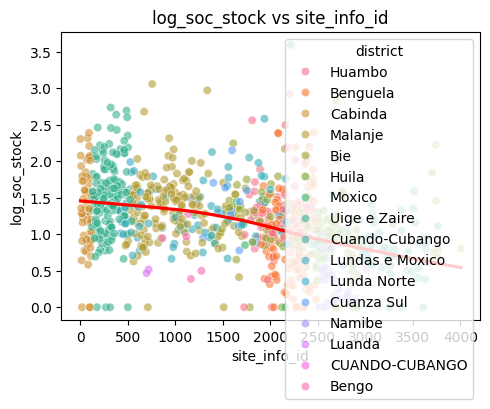

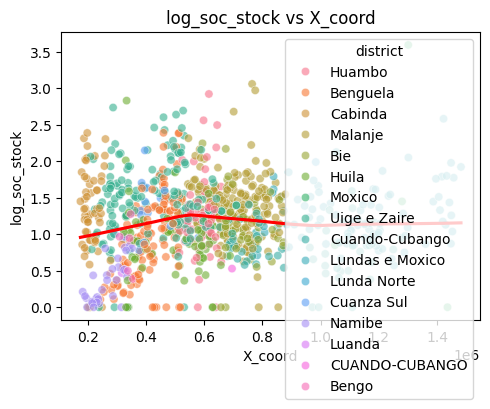

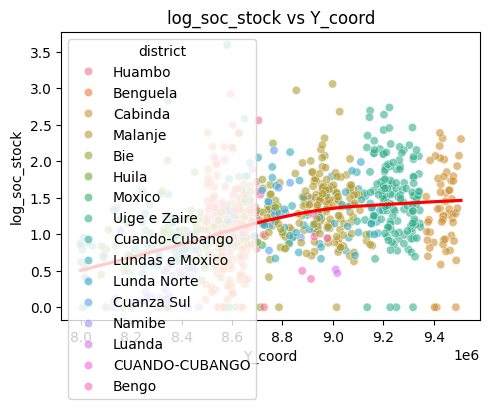

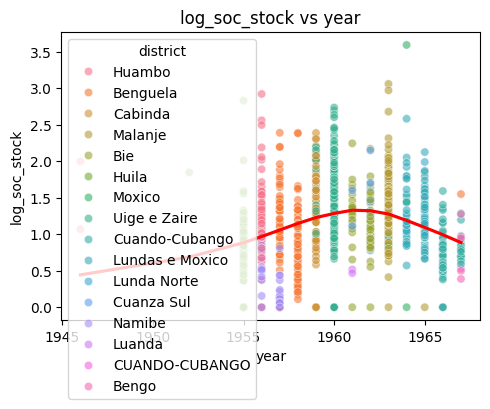

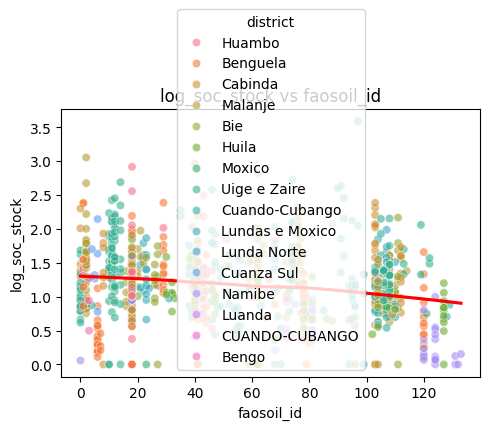

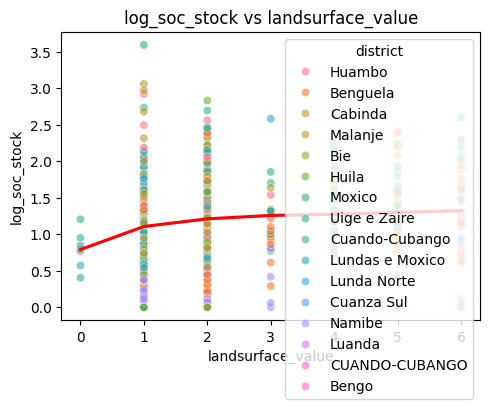

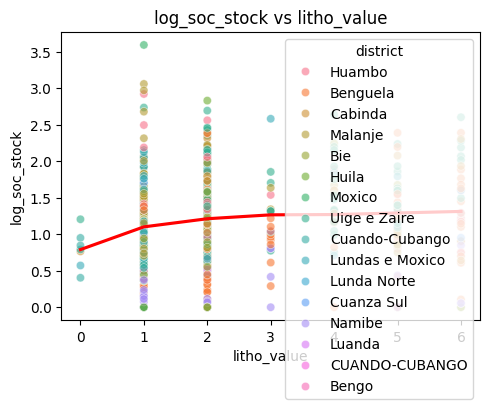

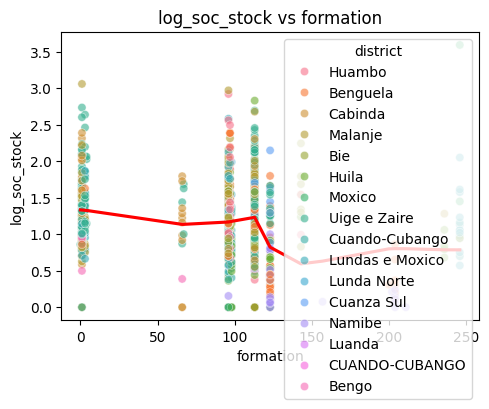

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


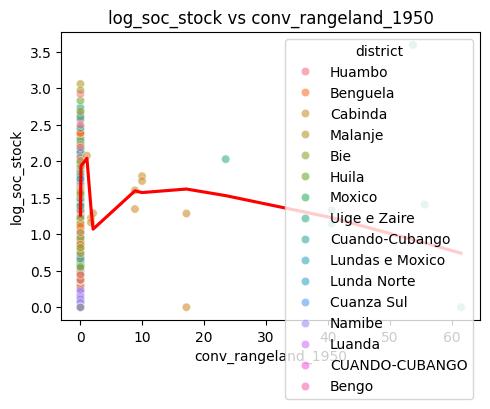

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


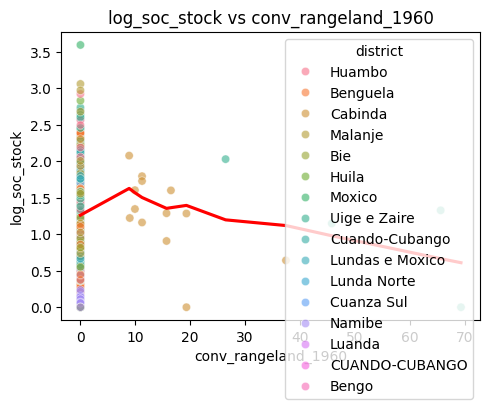

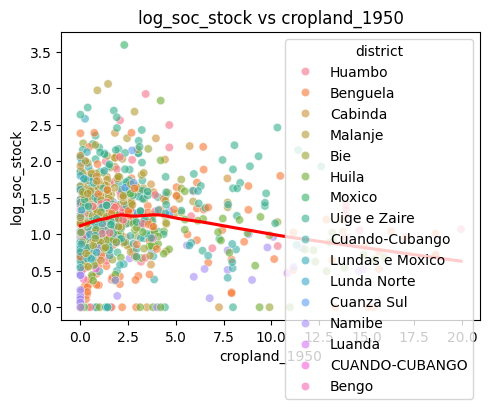

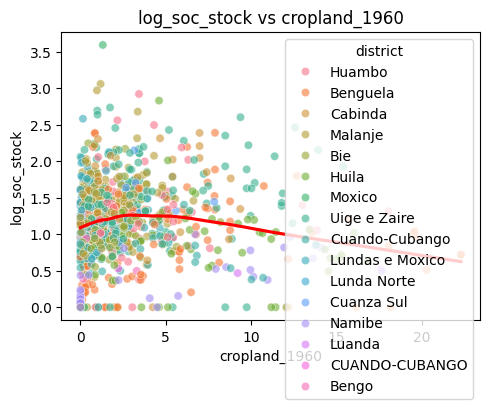

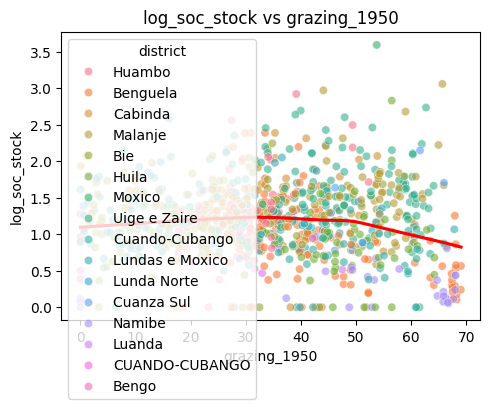

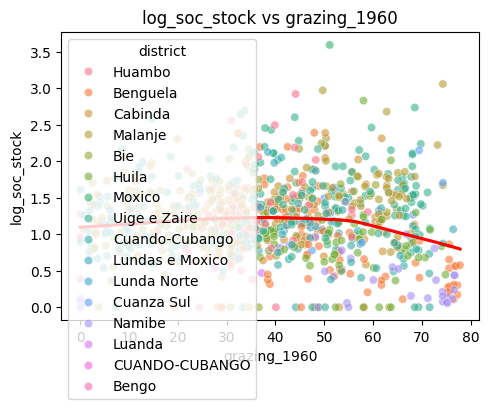

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


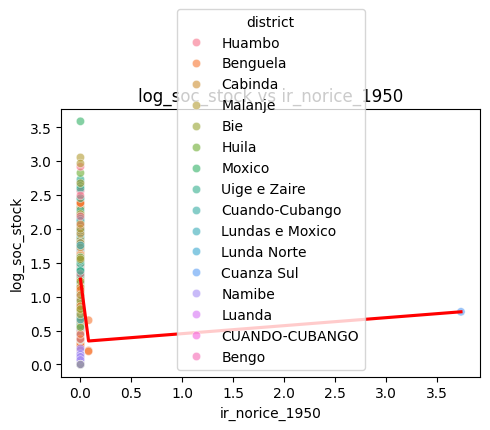

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


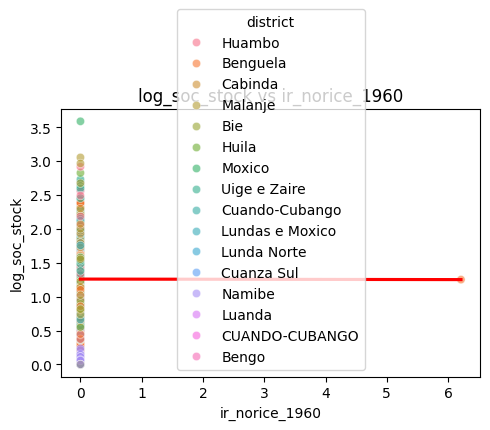

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


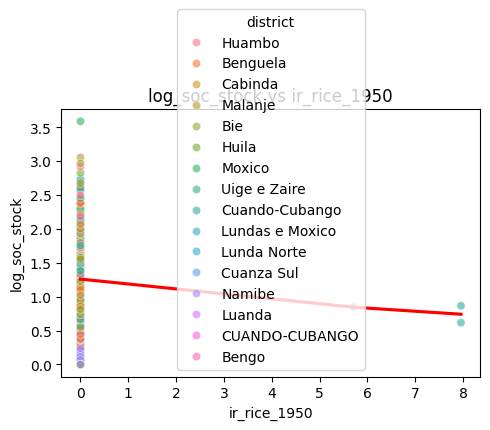

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


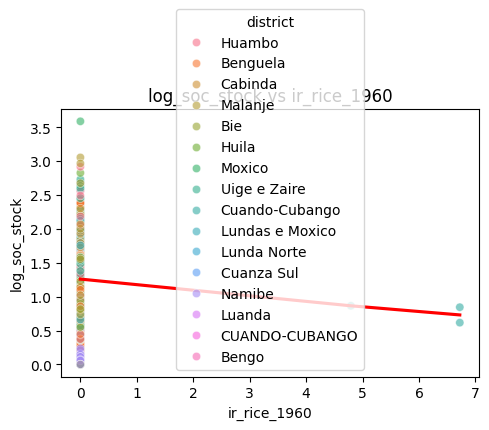

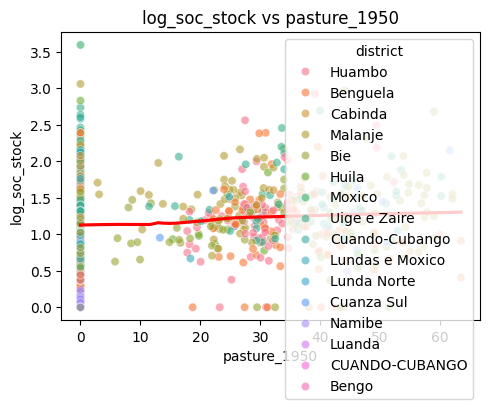

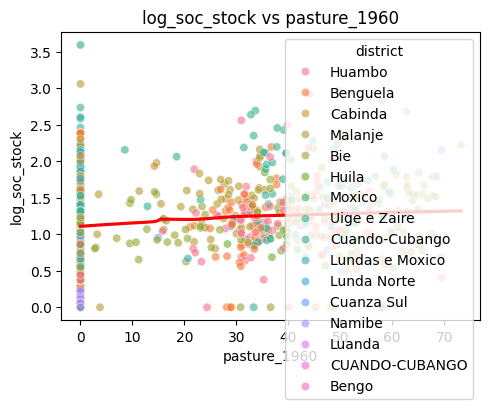

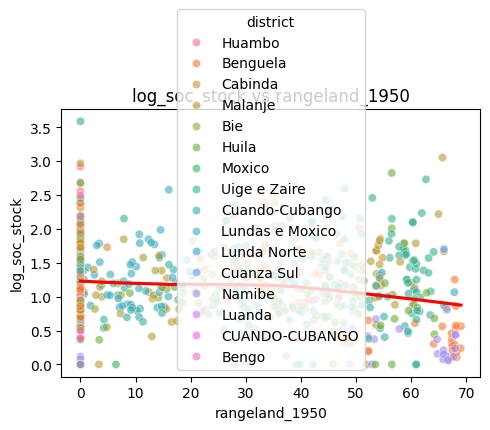

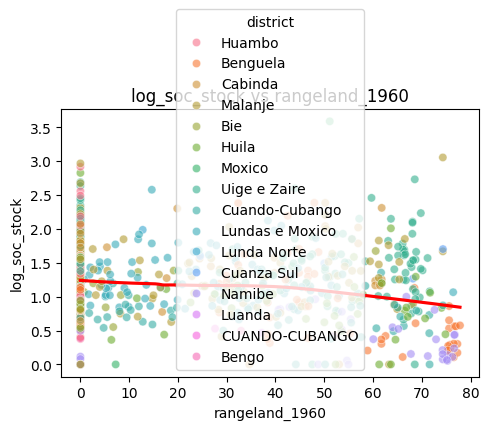

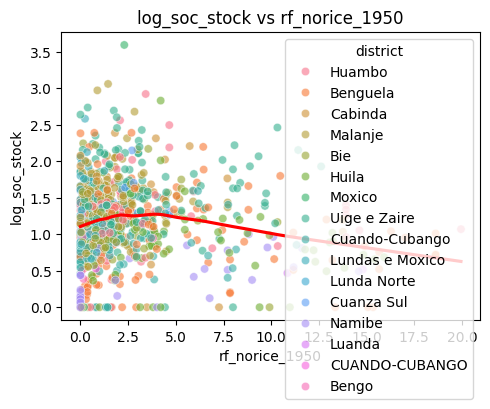

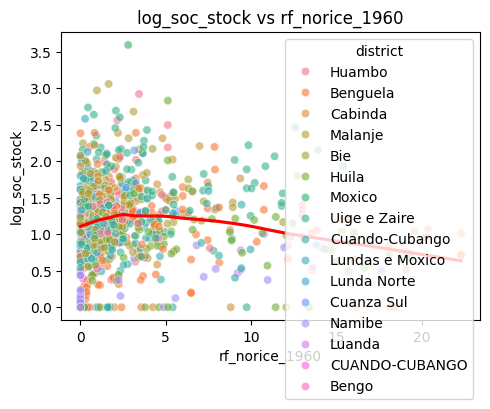

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


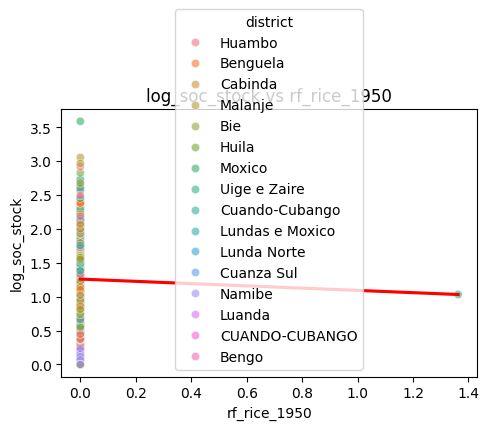

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


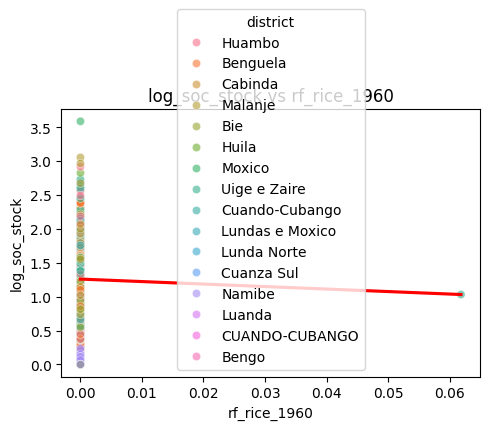

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


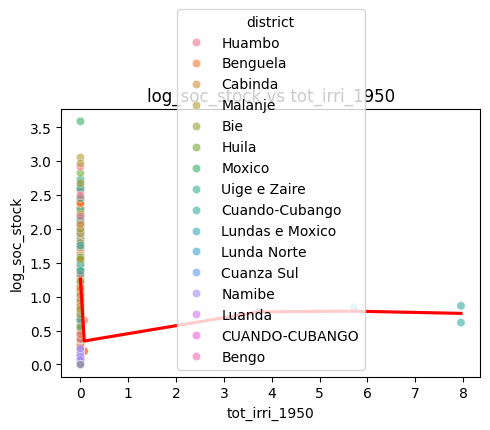

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


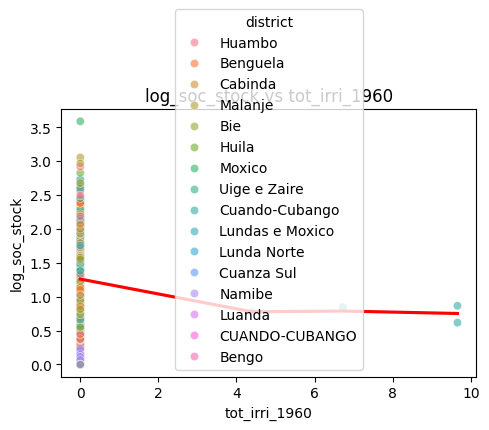

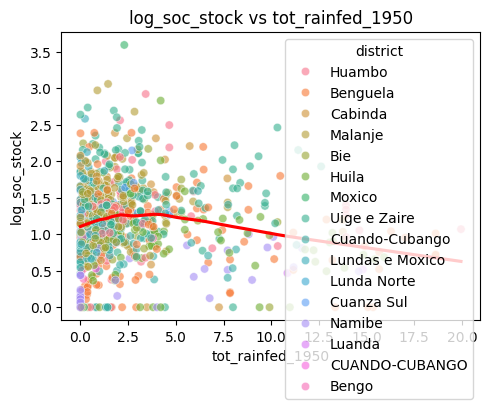

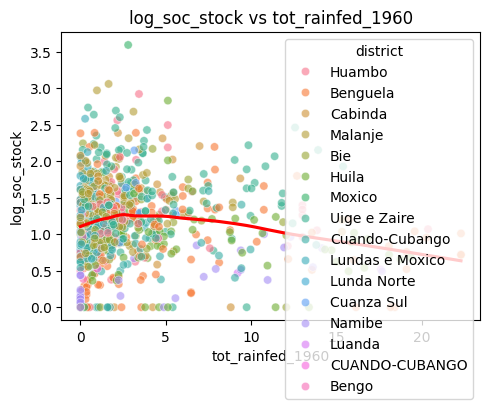

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


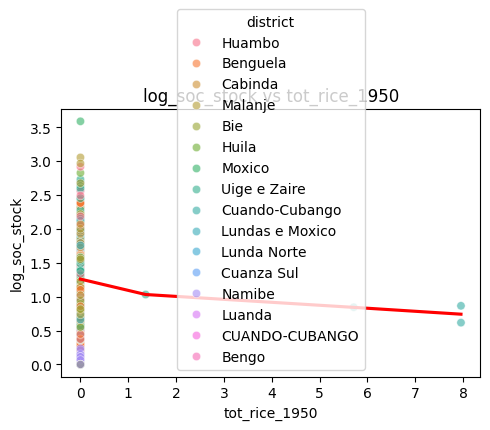

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


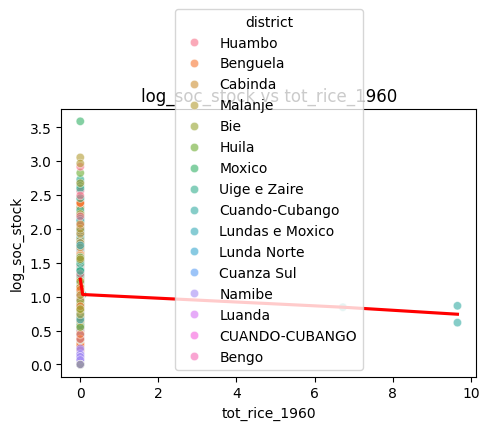

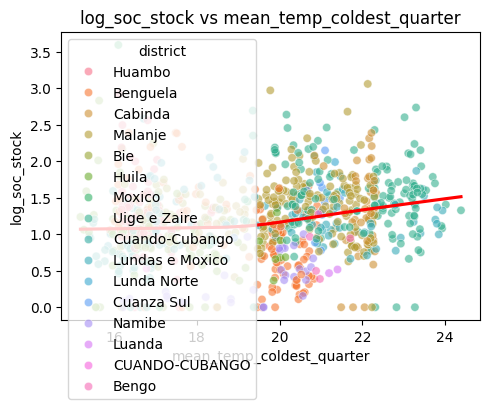

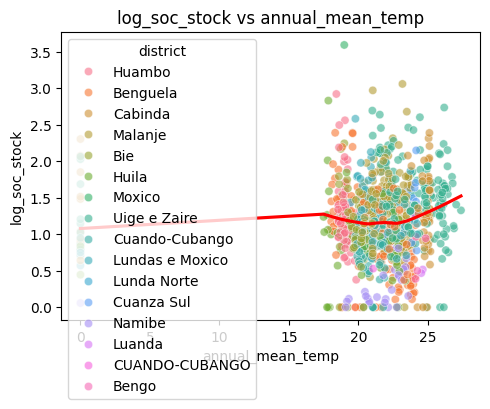

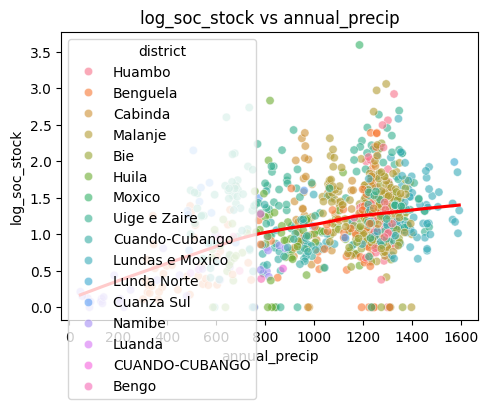

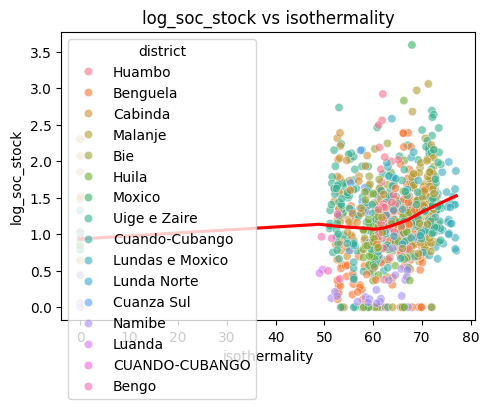

...

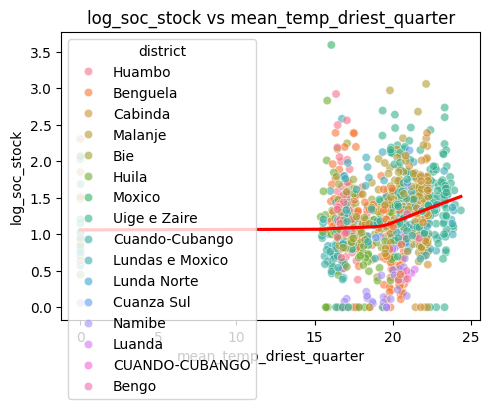

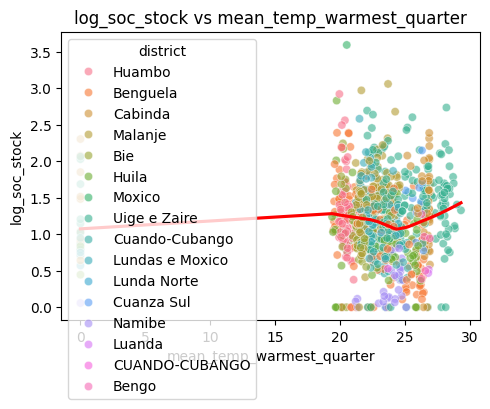

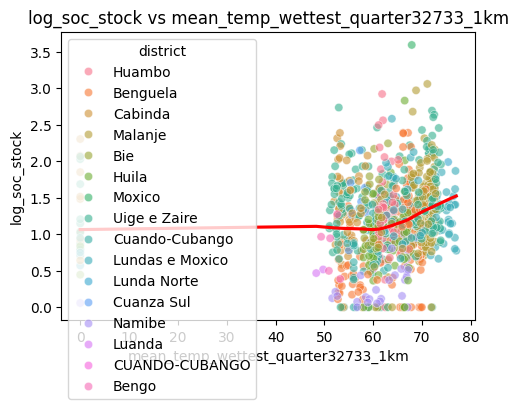

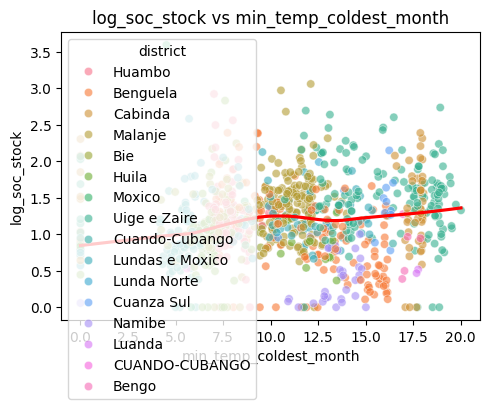

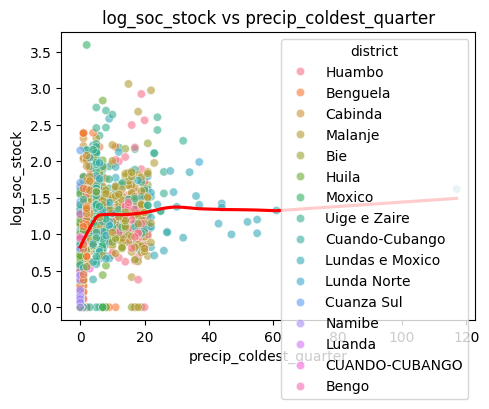

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


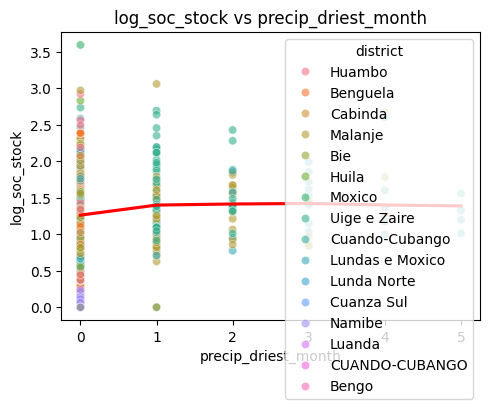

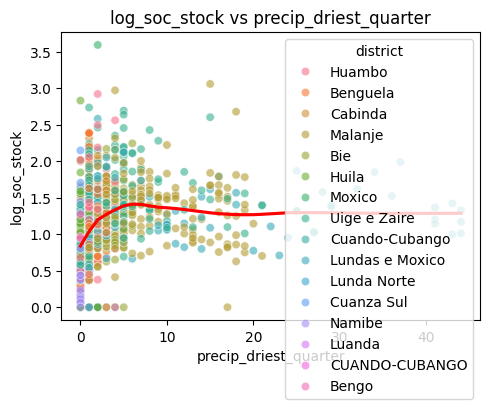

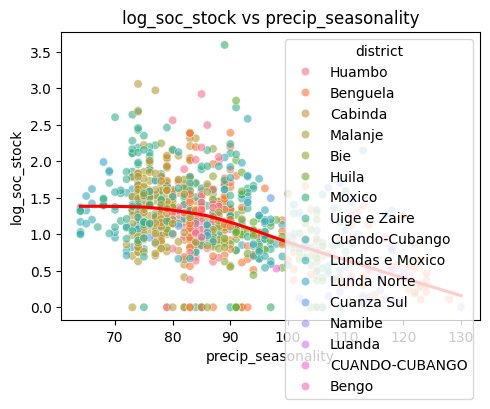

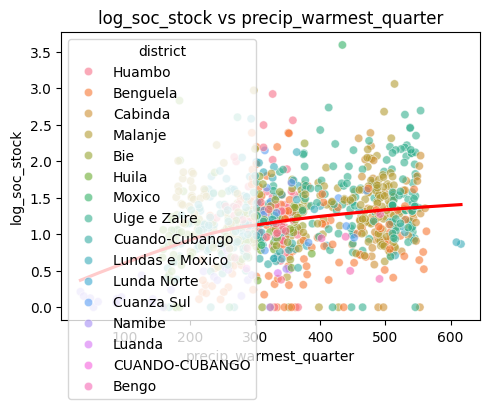

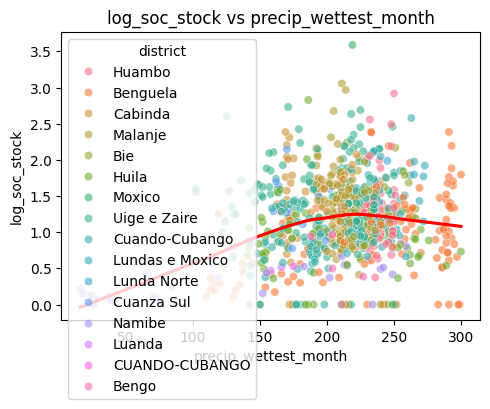

...

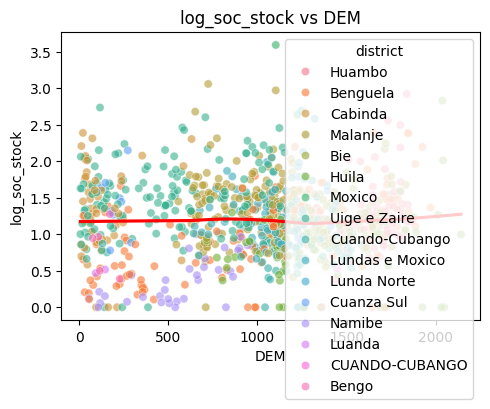

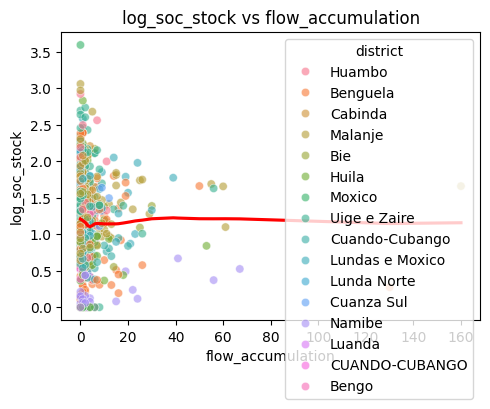

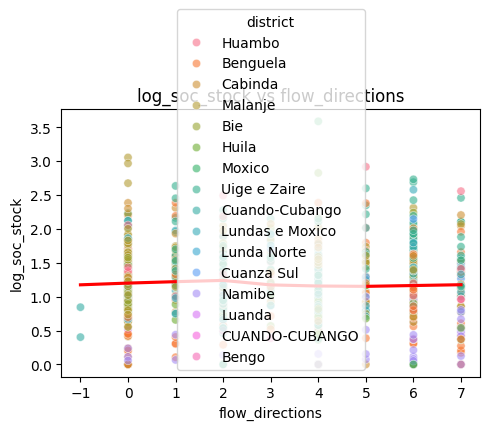

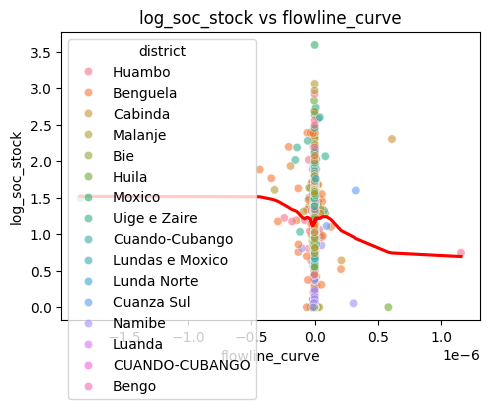

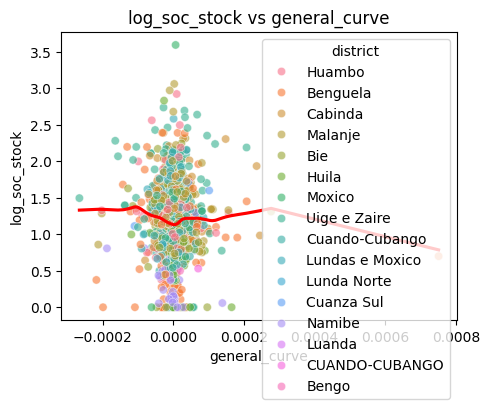

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


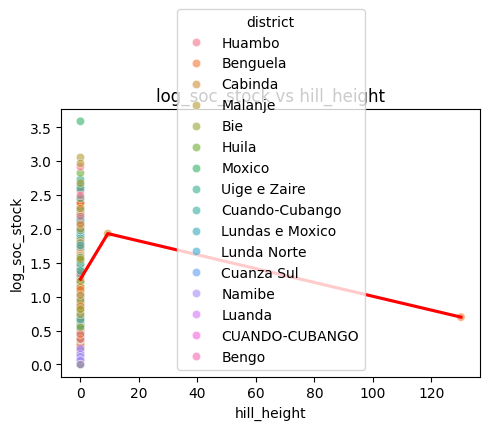

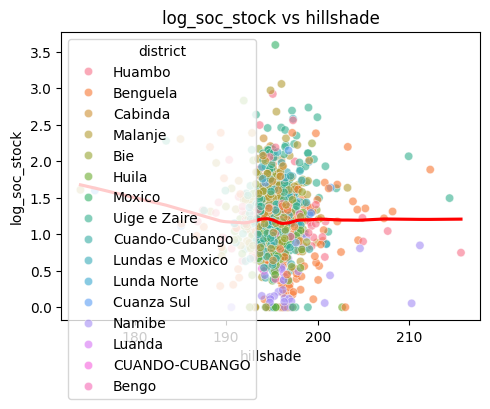

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


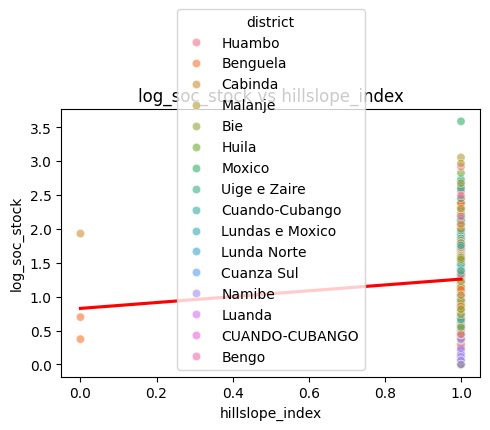

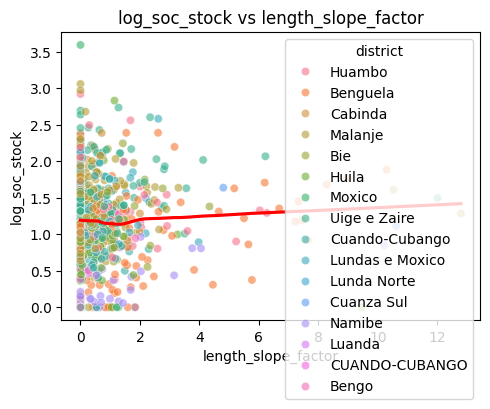

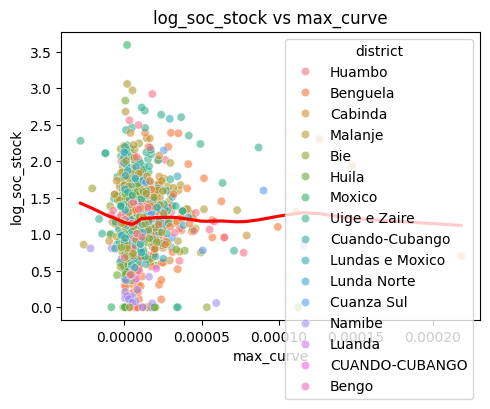

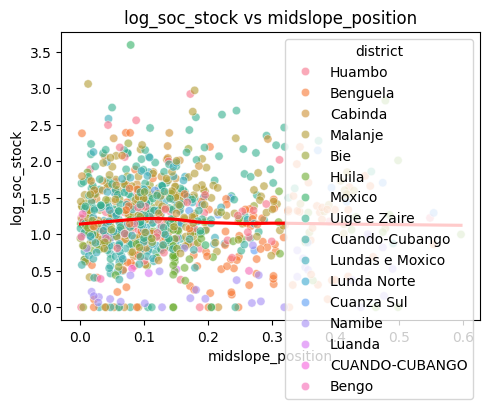

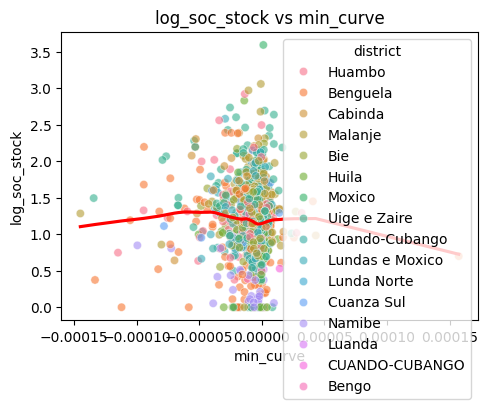

...

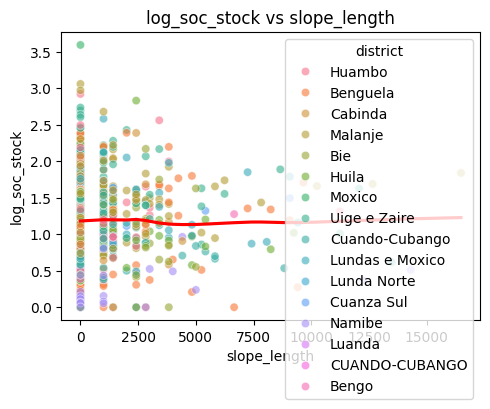

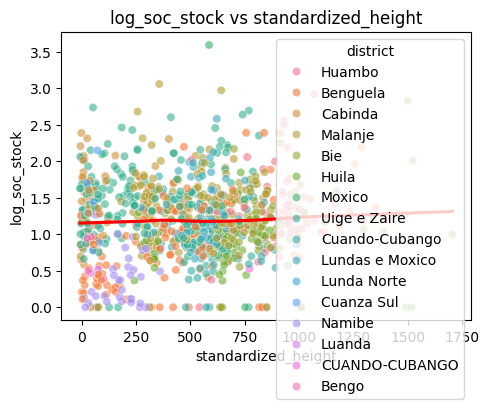

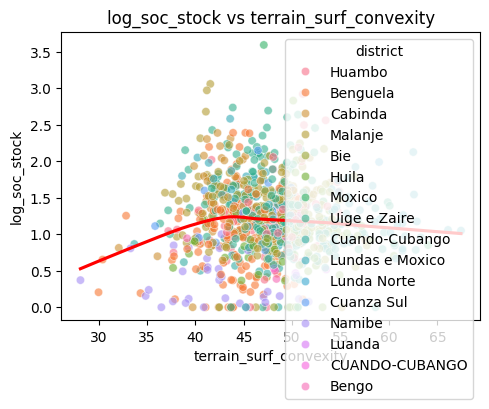

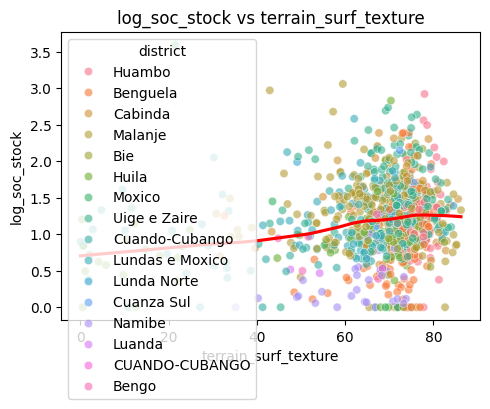

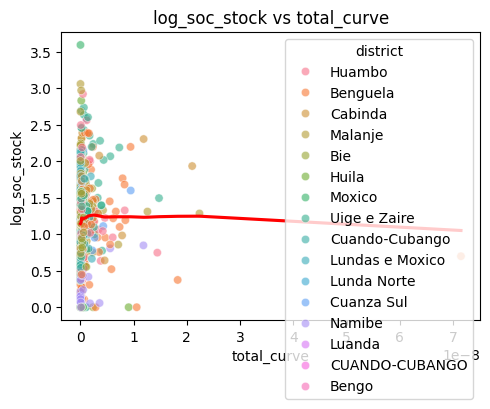

/opt/homebrew/lib/python3.11/site-packages/numpy/core/function_base.py:158: RuntimeWarning: invalid value encountered in multiply
  y *= step
/opt/homebrew/lib/python3.11/site-packages/numpy/core/function_base.py:168: RuntimeWarning: invalid value encountered in add
  y += start


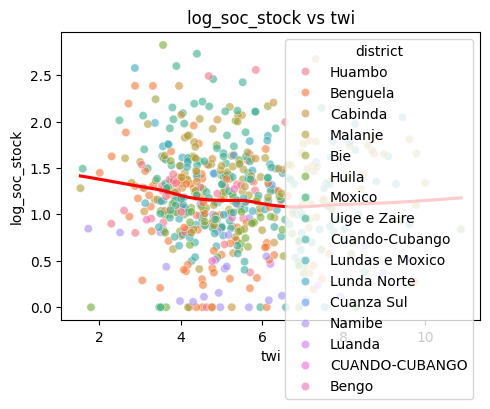

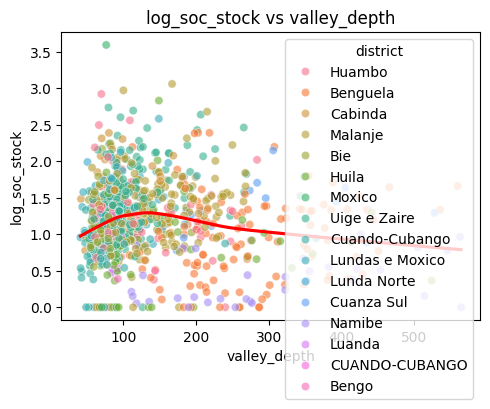

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


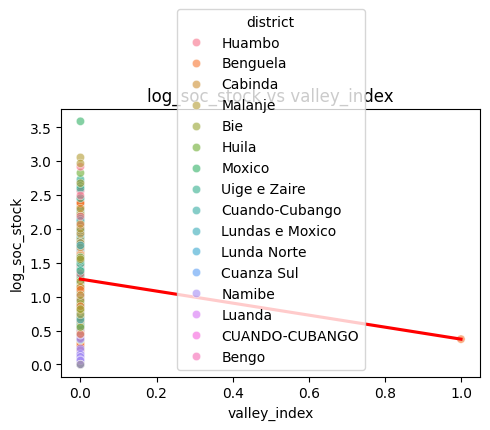

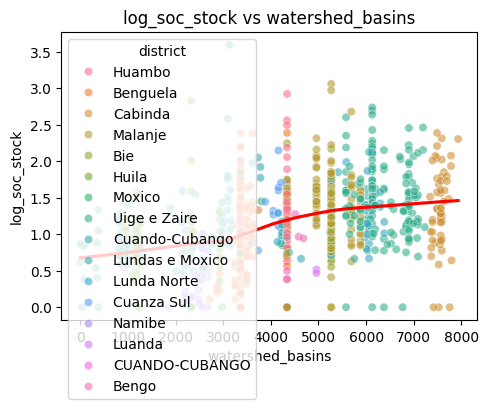

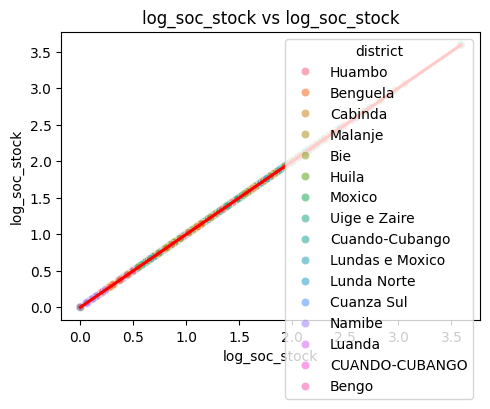

In [13]:

# Select numeric columns
numeric_cols = df1.select_dtypes(include=[np.number]).columns


# Check which numeric columns exist in df1
numeric_cols_existing = [col for col in numeric_cols if col in df1.columns]

# Create scatter plots vs log_soc_stock
for col in numeric_cols_existing:
    plt.figure(figsize=(5,4))
    sns.scatterplot(data=df1, x=col, y='log_soc_stock', alpha=0.6, hue='district')
    # Optional trend line (smoothed)
    sns.regplot(data=df1, x=col, y='log_soc_stock', scatter=False, lowess=True, color='red' )
    
    plt.title(f"log_soc_stock vs {col}")
    plt.xlabel(col)
    plt.ylabel("log_soc_stock")
    plt.tight_layout()
    plt.show()
    plt.close()